<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=20% > </center>

# <center> Assignment 1: Photometric Stereo & Colour </center>
<center> Computer Vision 1 University of Amsterdam </center>
<center> Due 23:59PM, September 16, 2023 (Amsterdam time) </center>
<center> <b>TA's: Ozzy Ülger, Egoitz Gonzalez, Sina Taslimi</b></center>
    
***

Student1 ID: 12672289 \
Student1 Name: Fien De Kok

Student2 ID: 15178331 \
Student2 Name: Jakub Tomaszewski

Student3 ID: 14950480 \
Student3 Name: Joan Velja

# General guidelines


Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to use the Python environment provided with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the 'Environment Setup' below you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```python
conda env create --file=environment.yaml```, then activate the environment using the command ```python conda activate cv1```.
- Please express your thoughts concisely. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a brief description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.
Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

# 0 Environment Setup

In [1]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D   # necessary in part 4.

In [2]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "3.4.8", "You're not using the provided Python environment!"
assert np.__version__ == "1.19.5", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.3.4", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

# 1 Colour Spaces *(13 pts)*

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

### 1.1 RGB Colour Model (2 pts)

Why do we use a RGB colour model as the basis of our digital cameras and photography? How does a standard digital camera capture the full RGB colour image?


The RGB (Red, Green, Blue) color model is widely used in digital cameras and photography because it is a convenient way to represent colors using a combination of three primary colors. The human eye has cells sensitive to different wavelengths of light, which allow us to perceive a wide range of colors. By simulating this process, the RGB color model can produce a large number of colors by combining different intensities of red, green, and blue light.

A standard digital camera captures a full RGB color image using an array of sensors that detect the intensity of light at each pixel location. The sensor array consists of three layers, each sensitive to a different primary color (red, green, and blue). Each layer converts the incoming light into a digital signal, which represents the intensity of the corresponding color at that location. These signals are then processed by the camera's electronics and software to create a final RGB image.

The process of capturing a full RGB color image with a digital camera involves several steps:

1. Light enters the lens of the camera and passes through a series of filters or color separating prisms, which separate the light into its individual primary colors.
2. The separated colors are then focused onto the sensor array, which contains millions of tiny light-sensitive diodes called photodiodes. Each photodiode measures the intensity of the light at a particular point on the image plane.
3. An analog-to-digital converter (ADC) converts the analog voltage from each photodiode into a digital value, representing the intensity of the corresponding color at that pixel location.
4. The digital values from all three color channels (red, green, and blue) are combined and stored in memory as a single integer value, representing the final RGB color of that pixel.
5. The camera's processor interpolates the missing values between pixels using various algorithms such as bilinear or bicubic interpolation, to produce a smooth and continuous image.
6. Additional processing steps like white balance correction, exposure compensation, and color space conversion may be applied to enhance the quality of the final image.
7. The resulting RGB image is then compressed using lossless or lossy compression algorithms, depending on the desired output format and file size.

### 1.2 Colour Space Conversion *(8 pts)*





Create a function to convert an RGB image into the following colour spaces by using the template code you are provided ConvertColourSpace() below and other sub-functions. Visualize the new image and its channels separately in the same figure. That is, for example, in the case of HSV colour space, you need to visualize the converted HSV image, and its Hue, Saturation and Value channels separately (4 images, 1 figure).

__Grayscale__

Convert the RGB image into grayscale by using 3 different methods mentioned in
https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/
In addition, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 in the same figure.

__Opponent Colour Space__

$\begin{pmatrix}
O_1 \\
O_2 \\
O_3
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R-G}{\sqrt{2}} \\
\frac{R+G-2B}{\sqrt{6}} \\
\frac{R+G+B}{\sqrt{3}}
\end{pmatrix}$

__Normalized RGB (rgb) Colour Space__

$\begin{pmatrix}
r \\
g \\
b
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R}{R+G+B} \\
\frac{G}{R+G+B} \\
\frac{B}{R+G+B}
\end{pmatrix}$

__HSV Colour Space__

Convert the RGB image into HSV Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

__YCbCr Colour Space__

Convert the RGB image into YCbCr Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Note, you need to arrange the channels in $Y, C_b$ and $C_r$ order.

__HINT 1__

Ensure you understand the datatypes and ranges that the python conversion and image displaying functions require. This usually is [0, 1] for float datatype or [0, 255] for integer datatype. You may have to explicitely change the datatype.

__HINT 2__

Think about how to visualise for instance H, S, V channels. Do this in a manner that is meaningful, e.g. visualize each of the H, S, V channels in a RGB manner.  

In [3]:
def rgb2grays(input_image, method='opencv'):
    
    input_image = input_image.astype(np.float32) / 255.0 # Normalizing the pixels to [0,1] range
    
    # converts an RGB into grayscale by using 4 different methods
    # built-in opencv function
    if method == 'opencv': # Method used by opencv: GRAY = 0.299 * R + 0.587 * G + 0.114 * B      Ref: https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)
        assert (len(new_image.shape) == 2)

    # lightness method
    elif method == 'lightness':
        new_image = (np.max(input_image,axis=-1,keepdims=1) / 2) + (np.min(input_image,axis=-1,keepdims=1) / 2)
        new_image = new_image[:, :, 0]
        
    # average method
    elif method == 'average':
        new_image = input_image.mean(axis=-1,keepdims=0) 

    # luminosity method
    elif method == 'luminosity':
        r, g, b = (input_image[:, :, 0], input_image[:, :, 1], input_image[:, :, 2])
        new_image = 0.21 * r + 0.72 * g  + 0.07 * b 

    assert (len(new_image.shape) == 2)

    return new_image


def rgb2opponent(input_image):
    # converts an RGB image into opponent colour space
    input_image = input_image.astype(np.float32) / 255.0
    r, g, b = (input_image[:, :, 0], input_image[:, :, 1], input_image[:, :, 2])

    o1 = (r - g) / (np.sqrt(2)) # in range [-1/sqrt(2), 1/sqrt(2)]
    o2 = (r + g - 2 * b) / (np.sqrt(6)) # in range [-2/sqrt(6), 2/sqrt(6)]
    o3 = (r + g + b) / (np.sqrt(3)) # in range [0, 3/sqrt(3)]

    # These three channels, which are brought to [0,1] by input_image = input_image.astype(np.float32) / 255.0,
    # will have to be normalized again into that range due to the operation we carry out on them.

    o1 = ((np.sqrt(2) / 2) * o1) + 0.5 
    o2 = (np.sqrt(6) / 4 * o2) + 0.5
    o3 *= np.sqrt(3) / 3


    new_image = np.dstack((o1, o2, o3))
    #new_image = np.clip(new_image, 0.0, 1.0)

    return new_image

def rgb2normedrgb(input_image):
    # converts an RGB image into normalized RGB colour space
    input_image = input_image.astype(np.float32) / 255.0

    r, g, b = (input_image[:, :, 0], input_image[:, :, 1], input_image[:, :, 2])
    z = r + g + b

    r_prime = r / (r + g + b + 1e-6)
    g_prime = g / (r + g + b + 1e-6)
    b_prime = b / (r + g + b + 1e-6)
    
    new_image = np.dstack((r_prime, g_prime, b_prime))

    return new_image

In [4]:
def visualize(input_image, new_image, colourspace='rgb', title=None):
    plt.figure(figsize=(10, 10))
    ch = {
        'rgb': ['Red', 'Green', 'Blue'],
        'hsv': ['Hue', 'Saturation', 'Value'],
        'ycbcr': ['Y', 'Cb', 'Cr'],
        'opponent': ['O1', 'O2', 'O3'],
        'normedrgb': ['r', 'g', 'b']
    }

    if colourspace == 'gray':
        methods = ['luminosity', 'average', 'lightness', 'opencv']
        gray_images = [rgb2grays(input_image, method.lower()) for method in methods]

        for i, (method_name, img) in enumerate(zip(methods, gray_images)):
            plt.subplot(2, 2, i+1)
            plt.imshow(img, cmap='gray')
            plt.title(method_name)
            plt.axis('off')

    elif colourspace == 'opponent':

        # O_1 is roughly a combination of (R - G). This means it's looking at the difference between the red and green channels. Positive values mean more red, negative values mean more green.
        # O_2 is a combination of the average of red and green minus blue, or (R + G - 2B). Values close to 1 signify more yellowish tones (given that yellow in RGB is a combination of red and green), while close to 0 values signify more blue.
        # O_3 is (R + G + B), or the overall brightness.

        o1, o2, o3 = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]
        
        o1_rgb = np.dstack((o1, 1.0 - o1, np.zeros_like(o1))) 
        # Explanation O_1 RGB (Red-Green): 
        # Red channel: Set to O_1 (Values close to 1 highlight red)
        # Green channel: Set to 1 - O_1 (Values close to 1 highlight green)
        # Blue channel: Set to zero
        

        o2_rgb = np.dstack((o2, o2, 1.0 - o2))
        # Explanation O_2 RGB (Yellow-Blue): 
        # Red and Green channels: Both set to O2 (positive values highlight yellow as yellow is a mix of red and green)
        # Blue channel: Set to 1-O2 (Values close to 1 highlight blue)
        

        # Since o3 conveys brightness, we will use the original o3 with a grayscale cmap.

        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('Converted')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(o1_rgb)
        plt.title(f"{ch[colourspace][0]}, Red-Green")
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(o2_rgb)
        plt.title(f"{ch[colourspace][1]}, Blue-Yellow")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(o3, cmap='gray')
        plt.title(f"{ch[colourspace][2]}, Brightness")
        plt.axis('off')

    elif colourspace == 'rgb':
        r, g, b = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]
        r_rgb = np.dstack((r, np.zeros_like(r), np.zeros_like(r)))
        g_rgb = np.dstack((np.zeros_like(g), g, np.zeros_like(g)))
        b_rgb = np.dstack((np.zeros_like(b), np.zeros_like(b), b))

        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('Converted')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(r_rgb)
        plt.title(f"{ch[colourspace][0]} (Normalized Red)")
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(g_rgb)
        plt.title(f"{ch[colourspace][1]} (Normalized Green)")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(b_rgb)
        plt.title(f"{ch[colourspace][2]} (Normalized Blue)")
        plt.axis('off')

            
    elif colourspace == 'hsv':

        # Modifications made according to slides, and then brought back to RGB for plotting purposes
        h, s, v = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]

        h_rgb = np.dstack((h, np.full_like(s, 255), np.full_like(v, 255)))
        h_rgb = cv2.cvtColor(h_rgb, cv2.COLOR_HSV2RGB)
        s_rgb = np.dstack((np.full_like(s, 179), s, np.full_like(v, 255)))
        s_rgb = cv2.cvtColor(s_rgb, cv2.COLOR_HSV2RGB)
        v_rgb = np.dstack((np.full_like(h, 179), np.zeros(s.shape, dtype=np.uint8), v))
        v_rgb = cv2.cvtColor(v_rgb, cv2.COLOR_HSV2RGB)
        
        
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('Converted')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(h_rgb)	
        plt.title(f"{ch[colourspace][0]}")
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(s_rgb)	
        plt.title(f"{ch[colourspace][1]}")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(v_rgb, cmap='gray')	
        plt.title(f"{ch[colourspace][2]}")
        plt.axis('off')

    
    elif colourspace == 'ycbcr':
        # y conveys brightness (grayscale), whereas Cb is the Blue-difference chroma component (difference between blue and reference) and Cr is the Red-difference chroma component (difference between red and reference).
        # We set the reference here to be gray, i.e. the average colour.
        y, cb, cr = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]
        cb_norm = (cb - cb.min()) / (cb.max() - cb.min())
        cr_norm = (cr - cr.min()) / (cr.max() - cr.min())

        cb_rgb = np.dstack((np.full_like(cb_norm, 0.5), np.full_like(cb_norm, 0.5), cb_norm)) # Creation of Cb for RGB plotting, where non blue channels are set at gray (=0.5) and the blue channel (last one) is set at [0,1] ranged Cb. 
        cr_rgb = np.dstack((cr_norm, np.full_like(cr_norm, 0.5), np.full_like(cr_norm, 0.5))) # Creation of Cr for RGB plotting, where non red channels are set at gray (=0.5) and the red channel (first one) is set at [0,1] ranged Cr. 

        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('Converted')
        plt.axis('off')

        plt.subplot(2, 2, 2)
        plt.imshow(y, cmap='gray')
        plt.title(f"{ch[colourspace][0]}")
        plt.axis('off')

        plt.subplot(2, 2, 3)
        plt.imshow(cb_rgb)
        plt.title(f"{ch[colourspace][1]} (Chroma Blue)")
        plt.axis('off')

        plt.subplot(2, 2, 4)
        plt.imshow(cr_rgb)
        plt.title(f"{ch[colourspace][2]} (Chroma Red)")
        plt.axis('off')

    if title is not None:
        plt.suptitle(title)
    plt.tight_layout()
    plt.show()

In [5]:
def ConvertColourSpace(input_image, colourspace, title=None):
    '''
    Converts an RGB image into a specified color space, visualizes the
    color channels and returns the image in its new color space.

    Colorspace options:
      opponent
      rgb -> for normalized RGB
      hsv
      ycbcr
      gray

    P.S: Do not forget the visualization part!
    '''


    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function
        new_image = rgb2opponent(input_image)
        print(f"O1 channel range = [{np.min(new_image[:, :, 0])}, {np.max(new_image[:, :, 0])}]")
        print(f"O2 channel range = [{np.min(new_image[:, :, 1])}, {np.max(new_image[:, :, 1])}]")
        print(f"O3 channel range = [{np.min(new_image[:, :, 2])}, {np.max(new_image[:, :, 2])}]")

        

    elif colourspace.lower() == 'rgb':
        # fill in the rgb2normedrgb function
        new_image = rgb2normedrgb(input_image)
        print(f"R' channel range = [{np.min(new_image[:, :, 0])}, {np.max(new_image[:, :, 0])}]")
        print(f"G' channel range = [{np.min(new_image[:, :, 1])}, {np.max(new_image[:, :, 1])}]")
        print(f"B' channel range = [{np.min(new_image[:, :, 2])}, {np.max(new_image[:, :, 2])}]")

        

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        #input_image = input_image.astype(np.float32) / 255.0
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

        print(f"H channel range = [{np.min(new_image[:, :, 0])}, {np.max(new_image[:, :, 0])}]")
        print(f"S channel range = [{np.min(new_image[:, :, 1])}, {np.max(new_image[:, :, 1])}]")
        print(f"V channel range = [{np.min(new_image[:, :, 2])}, {np.max(new_image[:, :, 2])}]")

        #new_image = new_image.astype(np.float32)
        #new_image[:,:,0] = new_image[:,:,0] / 179.0
        #new_image[:,:,1] = new_image[:,:,1] / 255.0
        #new_image[:,:,2] = new_image[:,:,2] / 255.0

        

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        y, cr, cb = new_image[:,:,0], new_image[:,:,1], new_image[:,:,2]
        
        print(f"Y channel range = [{np.min(new_image[:, :, 0])}, {np.max(new_image[:, :, 0])}]")
        print(f"Cr channel range = [{np.min(new_image[:, :, 1])}, {np.max(new_image[:, :, 1])}]")
        print(f"Cb channel range = [{np.min(new_image[:, :, 2])}, {np.max(new_image[:, :, 2])}]")

        #y = np.clip(new_image[:,:,0], 16, 235)
        #cr = np.clip(new_image[:,:,1], 16, 240)
        #cb = np.clip(new_image[:,:,2], 16, 235)

        new_image = np.dstack((y,cb,cr)) # Addressing the Cb Cr swap

    

    elif colourspace.lower() == 'gray':
        # fill in the rgb2grays function
        new_image = rgb2grays(input_image)
        

    else:
        print('Error: Unknown colorspace type [%s]...' % colourspace)
        new_image = input_image

    visualize(input_image, new_image, colourspace, title)

    return new_image

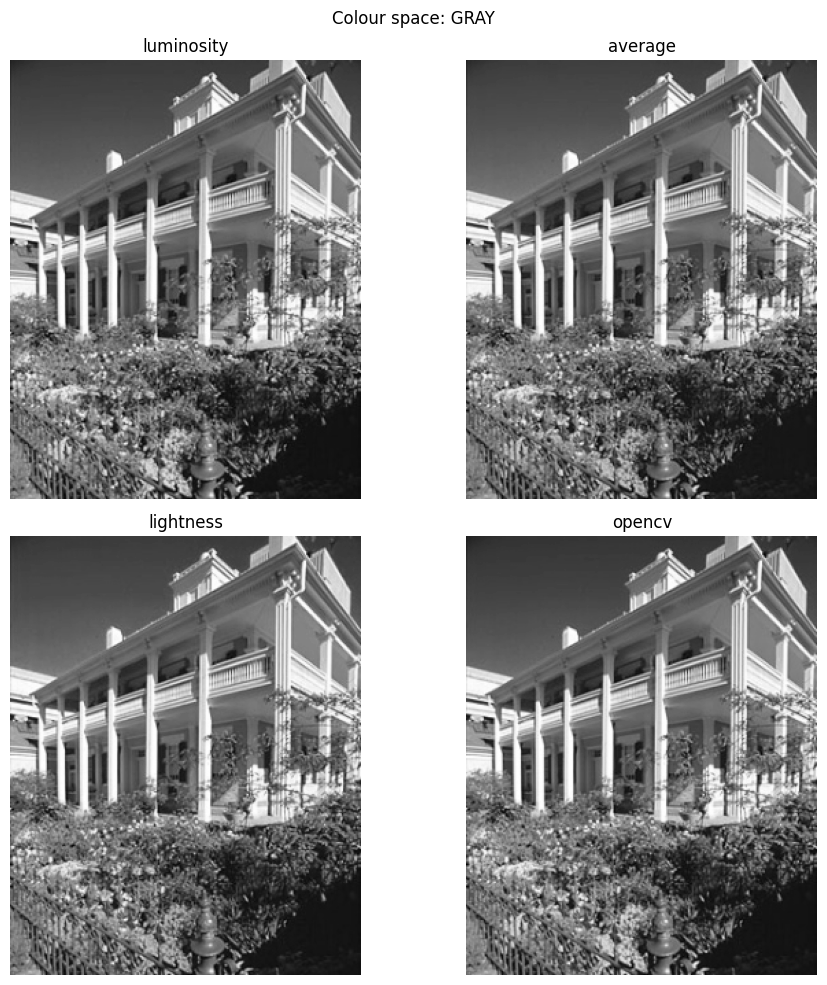

In [6]:
image = cv2.imread("./images/awb/awb.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
converted_image_gray = ConvertColourSpace(image, 'gray', title=f'Colour space: GRAY')

O1 channel range = [0.30392158031463623, 0.7862744927406311]
O2 channel range = [0.24803921580314636, 0.8176470994949341]
O3 channel range = [0.03006536141037941, 1.0]


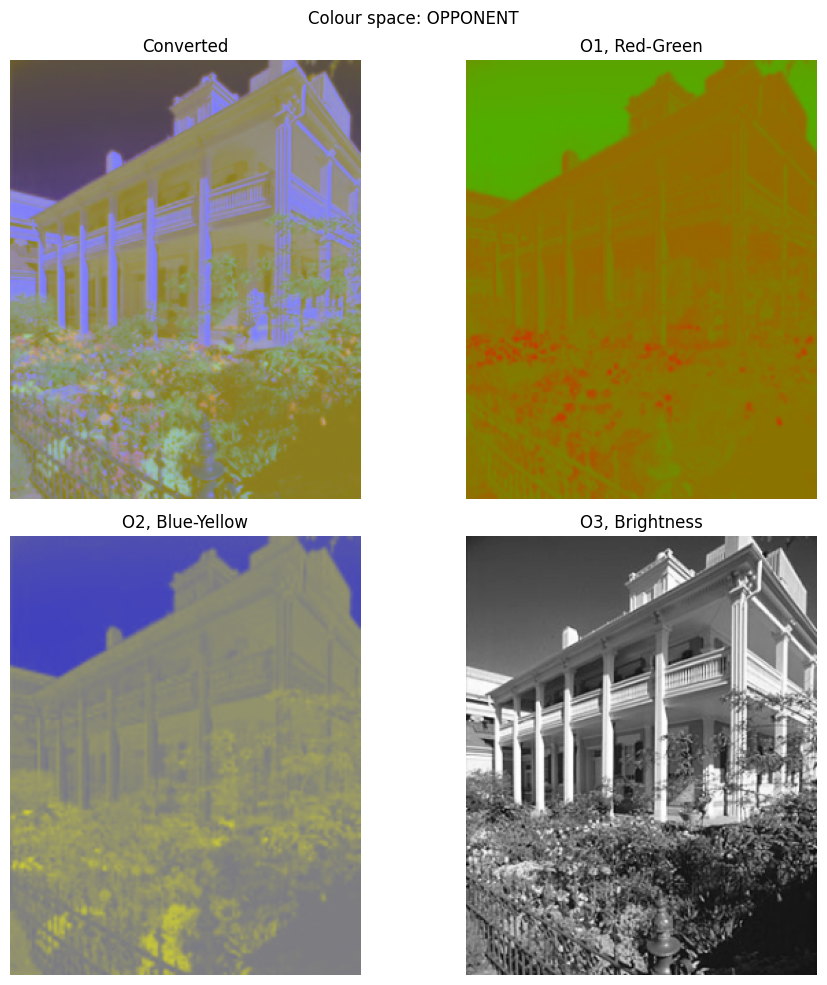

In [7]:
converted_image_opponent = ConvertColourSpace(image, 'opponent', title=f'Colour space: OPPONENT')

H channel range = [0, 179]
S channel range = [0, 255]
V channel range = [17, 255]


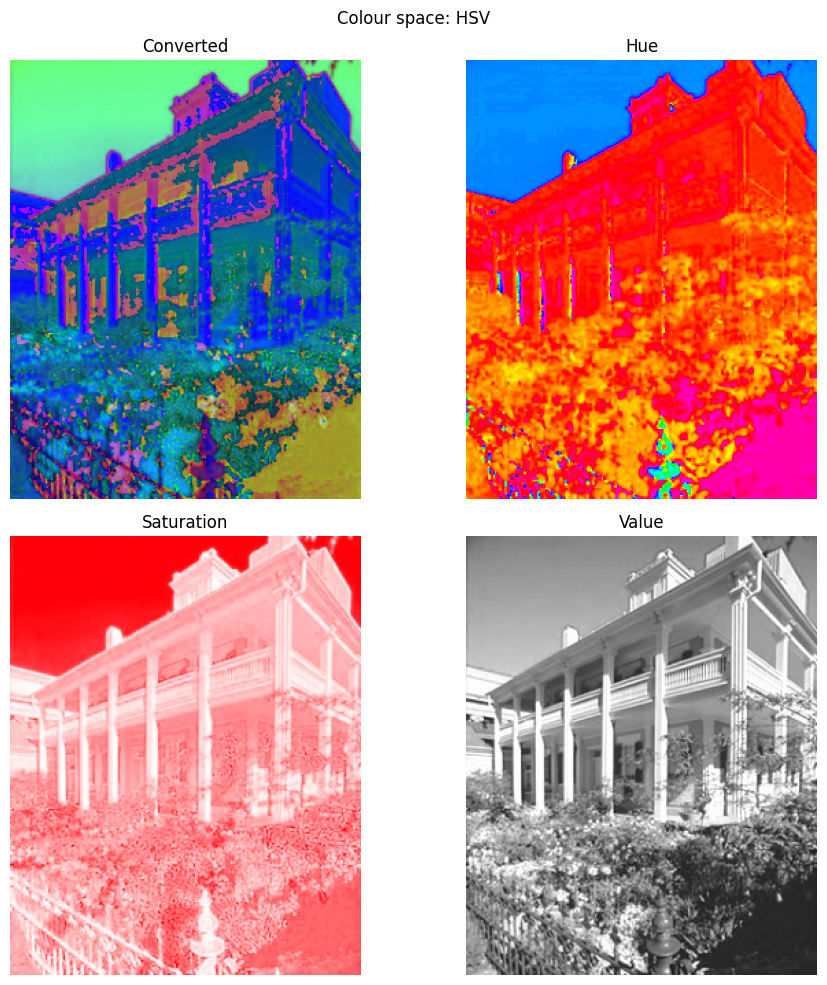

In [8]:
converted_image_hsv = ConvertColourSpace(image, 'hsv', title=f'Colour space: HSV')

Y channel range = [6, 255]
Cr channel range = [72, 202]
Cb channel range = [52, 186]


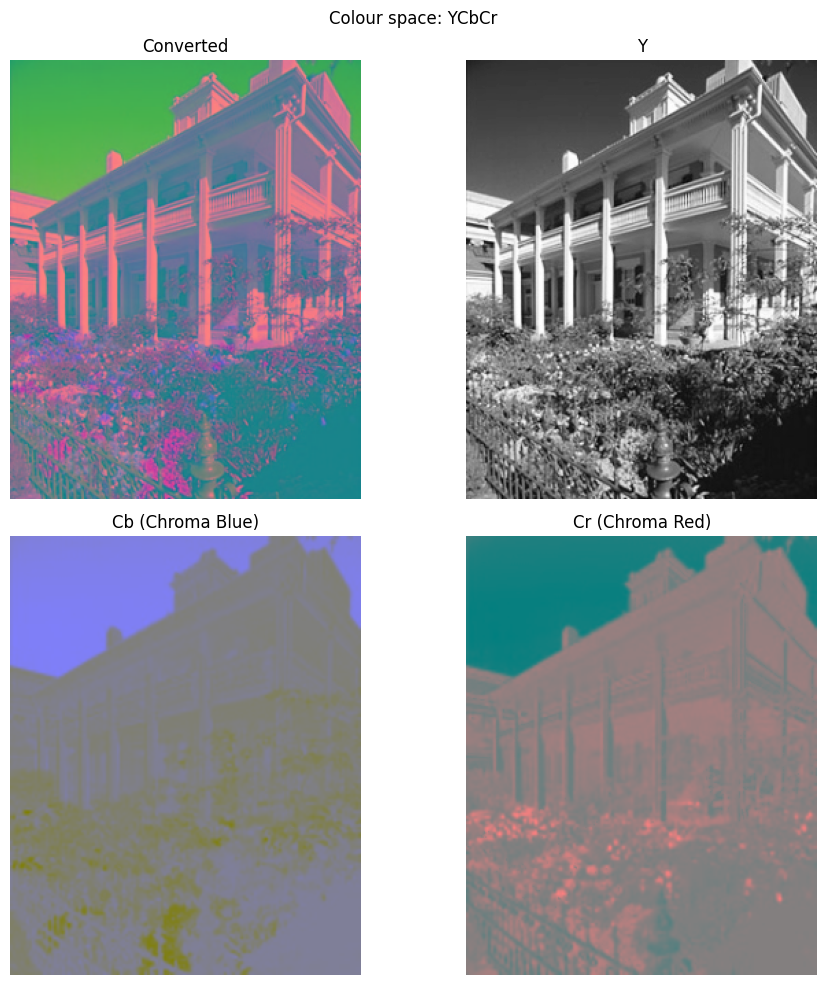

In [9]:
converted_image_ycbcr = ConvertColourSpace(image, 'ycbcr', title=f'Colour space: YCbCr')

R' channel range = [0.0, 0.9591786861419678]
G' channel range = [0.0, 0.46153661608695984]
B' channel range = [0.0, 0.6854824423789978]


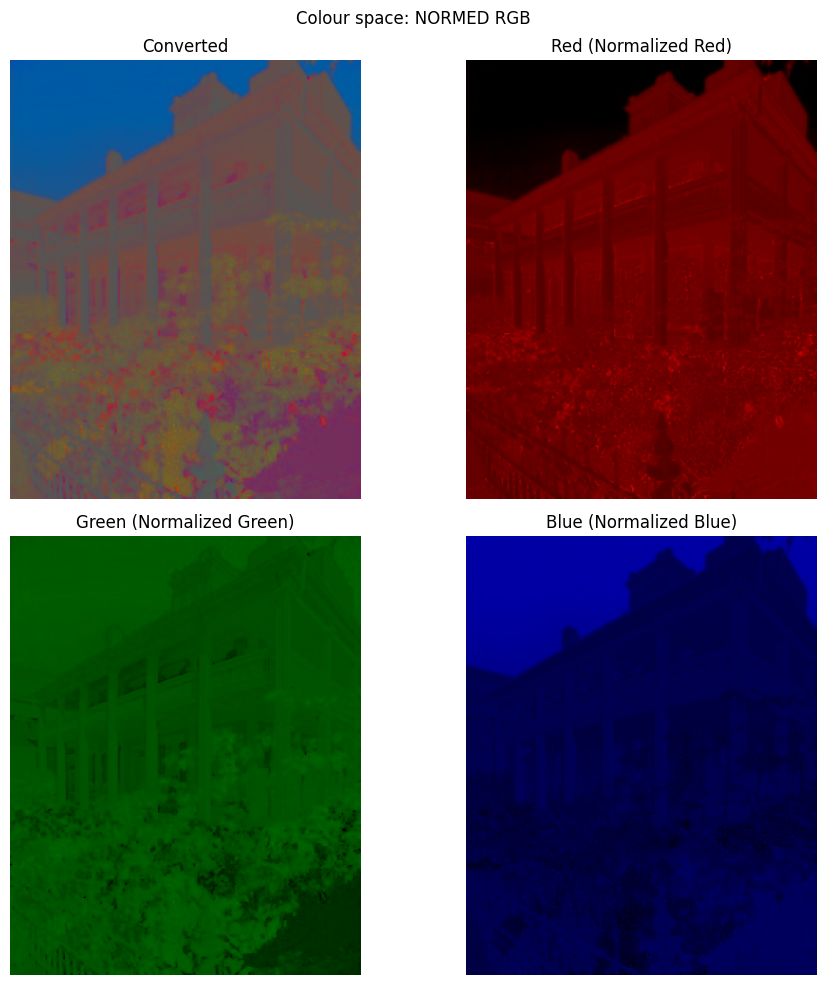

In [10]:
converted_image_normed_rbg = ConvertColourSpace(image, 'rgb', title=f'Colour space: NORMED RGB') # Normed RGB

### 1.3 Colour Space Properties (2 pts)

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

1. **Opponent Color Space**:
The opponent color space is a way of representing colors in a manner that is more similar to how our visual system processes colors. In this space, colors are represented as pairs of opponent colors (red-green, blue-yellow, black-white, also referred to as *luminance*) rather than the traditional RGB coordinates.

2. **Normalized RGB**:
Normalized RGB is a color space that maintains the same overall structure as RGB but with each channel scaled to have a maximum value of 1. This allows for better comparison of colors across different images and reduces the effect of uneven brightness levels. 

3. **HSV (Hue, Saturation, Value)**:
HSV is a color space that separates colors into three components: hue, saturation, and value. Hue represents the color's position around the color wheel, while saturation represents the purity of the color (i.e., how much white is mixed in). Value represents the brightness of the color. 

4. **YCbCr (Luminance, Chrominance Blue, Chrominance Red)**:
YCbCr is a color space commonly used in video and television systems. It separates colors into luminance (brightness) and two chrominance (color) components. Luminance (Y) represents the overall brightness of the pixel, while Cb and Cr represent the blue and red chrominance values, respectively. 

5. **Grayscale**:
Grayscale is a monochrome color space where each pixel value corresponds to a shade of gray. It's often used in applications such as medical imaging, astronomical imaging, and computer vision tasks like edge detection and thresholding.

##### **Benefits of each colour space**

1. **Opponent Color Space**:
    1. *Better representation of color differences*: The opponent color space allows for better modeling of color perception: the separation of luminance and chrominance can be useful for certain image processing tasks making it useful for applications like color constancy and object recognition.


2. **Normalized RGB**:
    1. *Illumination invariance*: Normalized RGB can reduce the effects of illumination changes in an image, which can be useful in scenarios where consistent color representation is essential despite different lighting conditions.

3. **HSV**:
    1. *Easier manipulation of colors*: HSV is more convenient for many image processing operations, like adjusting saturation or changing hue, since the components are not interdependent.

4. **YCbCr**:
    1. *Compression*: Separating luminance from chrominance channels allows for more aggressive compression of data without sacrificing image quality: typically, the chroma channels (Cb and Cr) can be subsampled without significant perceived loss in image quality, thus saving bandwidth or storage.


5. **Grayscale**:
    1. *Smaller file sizes*: Grayscale images have fewer color channels, resulting in smaller file sizes, which can make them faster to transmit and process.
    2. *Enhanced edge detection*: Grayscale representations can make it easier to detect edges and contours in images, as they accentuate the luminance information.

### 1.4 More on Colour Spaces (1 pt)

Find one more colour space from the literature, briefly explain its properties and give a use case.

One additional color space that can be useful for image processing and computer vision tasks is the YUV color space. YUV is a color model that separates luminance (brightness) information from chrominance (color) information, similar to the YCbCr color space. In YUV, the U channel represents blue-difference information, V represents red-difference information, and Y represents luminance (brightness) information. This separation allows for more efficient compression and manipulation of images.

**Properties**:

* YUV is a linear transformation of RGB and can be easily converted to RGB.
* YUV has better color reproduction compared to YCbCr, especially for still images.
* The Y channel contains luminance information, which means it can be easily used for applications such as edge detection and texture analysis.
* The U and V channels contain chroma information, which can be used for color correction and enhancement.

**Use Case**:

By converting the image to YUV and manipulating the U and V channels independently, we can create a colorized version of the image while preserving the original luminance information.

Here's a step-by-step example (code below):

1. Convert the RGB image to YUV using the following equation (we used cv2.COLOR_BGR2YUV for brevity):
Y = 0.299 * R + 0.587 * G + 0.134 * B
U = -0.299 * R - 0.587 * G + 0.867 * B
V = 0.587 * R - 0.587 * G - 0.134 * B

2. Manipulate the U and V channels to create a colorized version of the image. For example, we could increase the intensity of the blue in the U channel and the red in the V channel to make the orange shirt stand out more.

3. Convert the manipulated YUV image back to RGB to see the resulting colorization effect.

(-0.5, 255.5, 319.5, -0.5)

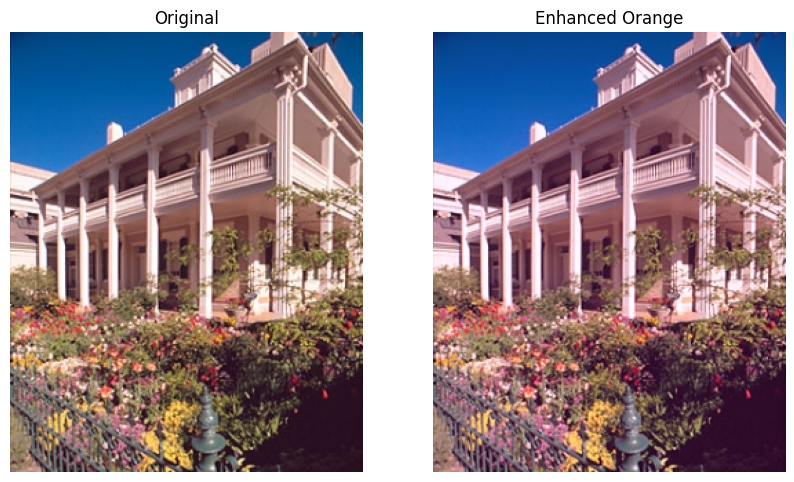

In [11]:
image = cv2.imread('./images/awb/awb.jpg')
img_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

yuv = cv2.cvtColor(image, cv2.COLOR_BGR2YUV)

yuv[:,:,1] += 5
yuv[:,:,2] += 5

rgb_proc = cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)

plt.figure(figsize=(10, 15))
plt.subplot(2, 2, 1)
plt.imshow(img_rgb)
plt.title('Original')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(rgb_proc)
plt.title('Enhanced Orange')
plt.axis('off')

# 2 Colour Constancy *(15 pts)*

Colour constancy is the ability to perceive colors of objects, invariant to the colour of the light source. The aim for colour constancy algorithms is first to estimate the illuminant of the light source, and then correct the image so that the corrected image appears to be taken under a canonical (white) light source. The task of the automatic white balance (AWB) is to do the same in digital cameras so that the images taken by a digital camera look as natural as possible.

In this part of the assignment, you will implement the most famous colour constancy algorithm; *Grey-World Algorithm*. The algorithm assumes that, under a white light source, the average colour in a scene should be achromatic (grey, [128, 128, 128]).

Specific information on the algorithm can be found on:
https://en.wikipedia.org/wiki/Color_normalization#Grey_world



### 2.1 Grey-World algorithm (8 pts)

Complete the function to apply colour correction to an RGB image by using Grey-World algorithm. Display the original image and the colour corrected one on the same figure. Use awb.jpg image (provided in the downloaded zip-file) to test your algorithm. In the end, you should see that the reddish colour cast on the image is removed and it looks more natural.

  ***Note:*** You do not need to apply any pre or post processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.
   

In [12]:
def grey_world(awb_img):

    awb_img = awb_img.astype(np.float32) / 255.0

    avg_r = np.mean(awb_img[:, :, 0])
    avg_g = np.mean(awb_img[:, :, 1])
    avg_b = np.mean(awb_img[:, :, 2])

    scale_r = 0.5 / (avg_r + 1e-10) # We put 0.5 as the value here because it represents gray in a [0,1] range! Also adding a small constant to avoid potential division by zero.
    scale_g = 0.5 / (avg_g + 1e-10)
    scale_b = 0.5 / (avg_b + 1e-10)

    colorCorrectedImg = awb_img.copy()
    colorCorrectedImg[:, :, 0] *= scale_r
    colorCorrectedImg[:, :, 1] *= scale_g
    colorCorrectedImg[:, :, 2] *= scale_b

    colorCorrectedImg = np.clip(colorCorrectedImg, 0.0, 1.0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(awb_img)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Color Corrected Image')
    plt.imshow(colorCorrectedImg)
    plt.axis('off')

    plt.tight_layout()
    plt.show()


    return colorCorrectedImg

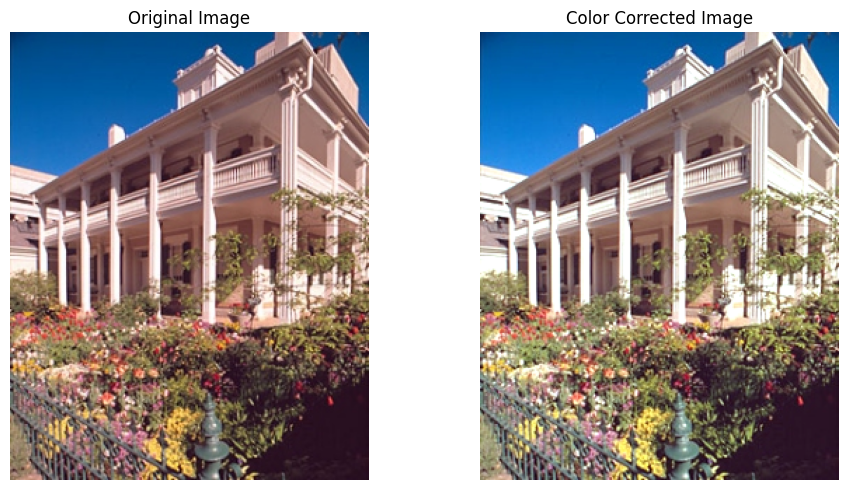

In [13]:
awb_img = cv2.imread('./images/awb/awb.jpg')
awb_img = cv2.cvtColor(awb_img, cv2.COLOR_BGR2RGB)
corrected_img = grey_world(awb_img)

### 2.2 Limits of Grey-World (2 pts)

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.


There are cases where the algorithm may fail to produce accurate results. Here's an example:

**Scenario**: suppose we have an image of a sunny daytime sky with scattered clouds. The scene is brightly lit by the sun, but the clouds create areas of shade that affect the overall brightness and color of the image. If we apply the Grey-World Algorithm to this image, it will assume that the entire scene is lit by a grey light source, which is not accurate. As a result, the algorithm will adjust the colors of the image to compensate for the perceived grey lighting condition, leading to an unnatural and washed-out appearance of the sky.

The failure of the Grey-World Algorithm in this case can be attributed to two main factors:

1. **Non-uniform illumination**: The scene contains areas of both bright direct sunlight and shade, which violates the assumption of uniform illumination made by the Grey-World Algorithm. This non-uniform illumination causes the algorithm to incorrecty estimate the colour of the scene.
2. **Insufficient context**: The Grey-World Algorithm relies on the assumption that the entire scene is lit by a single grey light source. However, in this case, the clouds provide a strong visual cue that the lighting conditions are not uniform, yet the algorithm does not take this into account.

To address these issues, more advanced algorithms such as White-Balance Correction or Shade Enhancement could be used instead of Grey-World. These algorithms consider the non-uniform illumination and take into account the specific characteristics of the scene, like the cloud cover, to produce a more natural and realistic enhancement of the original image.

### 2.3 Other Constancy algorithms (5 pts)

Find out one more colour constancy algorithm from the literature and explain it briefly.


One well-known color constancy algorithm from the literature is the "Retinex" algorithm, which is designed to correct for changes in lighting conditions and achieve color constancy in images. The Retinex algorithm was developed by Land and McCann in the 1970s and has evolved into various versions over the years. One of the most popular variants is the Single Scale Retinex (SSR).

**Single Scale Retinex (SSR):**

The Single Scale Retinex algorithm is a simplified version of the original Retinex algorithm, aiming to separate the illumination and reflectance components of an image. The main idea behind Retinex is to enhance the perception of the true color of objects in an image by compensating for variations in lighting.

Here's a brief explanation of how the SSR algorithm works:

1. **Illumination and Reflectance Separation:** The algorithm assumes that an image can be divided into two components: illumination and reflectance. The illumination represents the lighting conditions, and the reflectance represents the inherent color of the objects in the scene. The goal is to separate these two components.

2. **Logarithmic Transformation:** The first step involves taking the logarithm of the input image to convert it from the RGB color space to a more perceptually uniform color space (such as CIELab or CIELuv). This step helps in reducing the influence of illumination variations.

3. **Local Mean Removal:** A local mean value is calculated for each pixel in the log-transformed image. This local mean represents the estimated illumination at that pixel. This is typically done using a Gaussian filter or other smoothing techniques to capture the global illumination.

4. **Reflectance Estimation:** To estimate the reflectance component, the local mean is subtracted from the log-transformed image. This results in an image where the illumination variations are minimized, leaving behind the reflectance information.

5. **Expanding the Dynamic Range:** Finally, the estimated reflectance is exponentiated to return to the original color space, effectively expanding the dynamic range of the image. This process enhances the perception of colors and removes the influence of uneven lighting.

The SSR algorithm can improve color constancy by separating the effects of illumination and reflectance. It is particularly useful in scenarios where lighting conditions vary significantly across the image, making it challenging to achieve accurate color correction with Grey-World.

# 3 Intrinsic Image Decomposition *(12 pts)*


Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography applications: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>1. [^](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>2. [^](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/



### 3.1 Image decomposition *(2 pts)*

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

An image can be decomposed into several components beyond albedo and shading. One such component is texture. Texture refers to the surface properties of objects in an image, such as their roughness, smoothness, or pattern.

An example of an image decomposition technique that includes texture is texture segmentation. This technique separates an image into regions based on their textural properties, allowing for further analysis or processing of specific areas of interest. For instance, in medical imaging, texture segmentation can help identify tumors or lesions by analyzing the texture patterns in MRI scans.

### 3.2 Synthetic data *(2 pts)*

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

The reason why most datasets used for intrinsic image decomposition are synthetic boils down to several factors, but we believe two are crucial.
To start with, creating ground truth data for real-world images is extremely challenging. For albedo and shading, we would need to capture images under perfectly uniform lighting (to extract true reflectance) and have a way to capture just the shading without the reflectance, which is almost impossible with real-world scenes. Another reason why we use mostly synthetic images is noise: real-world images are subject to various sources of noise, including sensor noise, compression artifacts, and other imperfections. These can make the decomposition task even more challenging.

### 3.3. Reconstructing *(4 pts)*

Pick a favorite object from the synthetic intrinsic image dataset and store it's original image, shading and reflectance in a new folder in *'./images'*, e.g. *./images/intrinsic_images/* (or choose your own folder and change the path in the code). Show that you can actually reconstruct the original PNG image from its intrinsics using the albedo and shading. In the end, your script should output a figure displaying the original image, its intrinsic images and the reconstructed one. Complete the code for function **iid_image_formation()**.

The auxiliary functions are for opening and visualizing the original and intrinsic images. In your submission, only supply the images of the object you picked.

In [14]:
def iid_image_formation(albedo_img, shading_img):

    albedo_img = albedo_img.astype(np.float32) / 255.0
    shading_img = shading_img.astype(np.float32) / 255.0

    idd_img = albedo_img * shading_img

    idd_img = (idd_img * 255).astype(np.uint8)
    idd_img = np.clip(idd_img, 0, 255)

    return idd_img

In [15]:
def visualize_idd(base_image, albedo_img, shading_img, idd_img):
    
    plt.subplot(2, 2, 1)
    plt.imshow(base_image)
    plt.title('Base image')
    plt.axis('off')

    plt.subplot(2, 2, 2)
    plt.imshow(albedo_img)
    plt.title("Albedo")
    plt.axis('off')

    plt.subplot(2, 2, 3)
    plt.imshow(shading_img)
    plt.title("Shading")
    plt.axis('off')

    plt.subplot(2, 2, 4)
    plt.imshow(idd_img)
    plt.title("Reconstruction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


turt_dl.png: (270, 480, 3)
objectShading: (270, 480, 3)
objectAlbedo: (270, 480, 3)


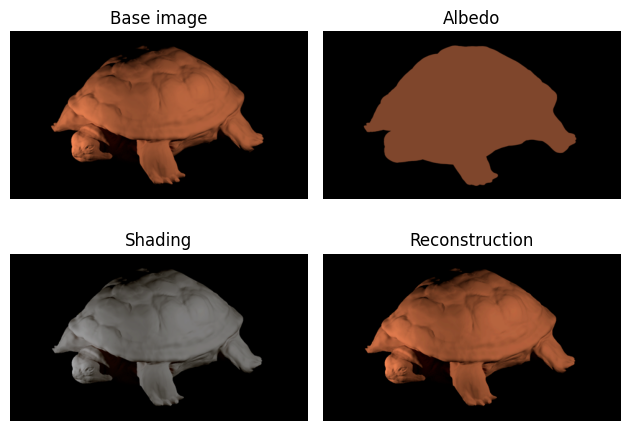

In [16]:
img_path = './images/intrinsic_images/'
object_name = 'turt_dl.png'
object_name_shadow = 'turt_dl_shad.png'
object_name_reflectance = 'turt_refl.png'


## Read with opencv
picked_object = cv2.imread(img_path + object_name)
if picked_object is None:
    print('no image found')
else:
    print(object_name + ':', picked_object.shape)

objectShading = cv2.imread(img_path + object_name_shadow)
if objectShading is None:
    print('no image found')
else:
    print('objectShading:', objectShading.shape)

objectAlbedo = cv2.imread(img_path + object_name_reflectance)
if objectAlbedo is None:
    print('no image found')
else:
    print('objectAlbedo:', objectAlbedo.shape)


picked_object_IDD = iid_image_formation(objectAlbedo, objectShading)

picked_object_vis = cv2.cvtColor(picked_object, cv2.COLOR_BGR2RGB)
objectAlbedo_vis = cv2.cvtColor(objectAlbedo, cv2.COLOR_BGR2RGB)
objectShading_vis = cv2.cvtColor(objectShading, cv2.COLOR_BGR2RGB)
picked_object_IDD_vis = cv2.cvtColor(picked_object_IDD, cv2.COLOR_BGR2RGB)


visualize_idd((picked_object_vis/picked_object_vis.max()*255.).astype(int), objectAlbedo_vis, objectShading_vis,
          (picked_object_IDD_vis/picked_object_IDD_vis.max()*255.).astype(int))

### 3.4 Recoloring *(4 pts)*


Manipulating colours in photographs is an important problem with many applications in computer vision. Since the aim for recolouring algorithms is just to manipulate colours, better results can be obtained for such a task if the albedo image is available as it is independent of confounding illumination effects.

Assume that you are given the PNG image and you have access to its
intrinsic albedo and shading images.
1. Find out the true material colour of the object you picked in RGB space (which is uniform in this case).
2. Recolour the object's image with pure green (0, 255, 0). Display the original object image and the recoloured version on the same figure. Complete the code for function **recolouring()**.

3. Although you have recoloured the object with pure green, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

In [17]:
def recolouring(albedo, shading):

    albedo = albedo.astype(np.float32) / 255.0
    shading = shading.astype(np.float32) / 255.0
    
    true_color = np.mean(np.mean(albedo, axis=0), axis=0)
    print("True color of the object in RGB:", true_color.astype(np.float32))
    
    # Complex implementation: # Select all colours dimensionally close to the true color (within a given distance)
    #difference = np.linalg.norm(albedo - true_color, axis=-1) 
    #mask = difference < 0.05
    #recoloured_albedo = np.copy(albedo)
    #recoloured_albedo[mask] = [0, 1.0, 0]

    #recoloured_image = recoloured_albedo * (shading)

    # Alternative (easier) implementation, recolours everything
    
    pure_green = np.array([0, 1.0, 0])
    ratio = pure_green / (true_color + 1e-15) #Adding a small constant to avoid potential division by 0

    recoloured_albedo = albedo * ratio
    recoloured_image = recoloured_albedo * shading

    recoloured_image = np.clip((recoloured_image * 255), 0, 255).astype(np.uint8)

    return recoloured_image, recoloured_albedo


True color of the object in RGB: [0.06009327 0.09563793 0.17355889]


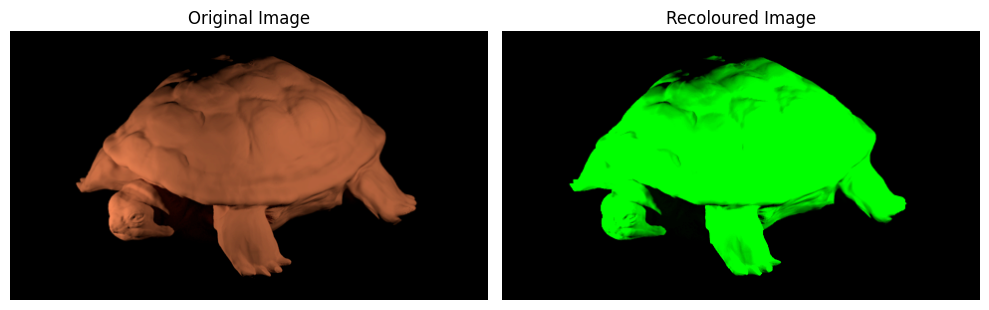

In [18]:
def visualize_original_and_recoloured(original_img, recoloured_img):
    plt.figure(figsize=(10, 5))
    
    # Display the original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    
    # Display the recoloured image
    plt.subplot(1, 2, 2)
    plt.imshow(recoloured_img)
    plt.title('Recoloured Image')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Assuming you've already defined and used the recolouring() function
# albedo_img and shading_img should be loaded or defined before
recoloured_image, recoloured_albedo = recolouring(objectAlbedo, objectShading)

# Visualize
visualize_original_and_recoloured((picked_object_vis/picked_object_vis.max()*255.).astype(int),
                                  recoloured_image)

The reason behind the green not being uniform is because, although we have manipulated the albedo (`recoloured_albedo`), in order to reconstruct the image we still carry out the element-wise product of the recoloured albedo $R_r(\vec{x})$ and shading $S(\vec{x})$ :

$$I_r(\vec{x})=R_r(\vec{x}) \times S(\vec{x})$$ 


Thus the green recolouring will not be uniform due to the shading affecting the reconstruction regardless of what manipulation we carry out on the albedo. When we combine a uniform color (from albedo) with non-uniform lighting (from shading), the result is a non-uniform appearance of that color in the final image. Instead, if we compare albedos only... (see below)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


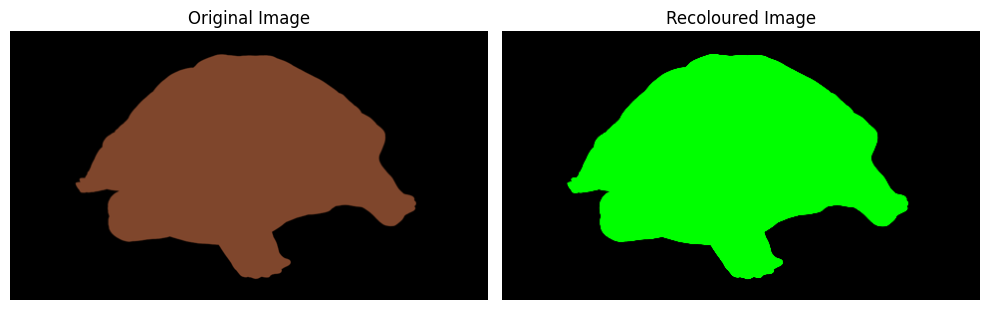

In [19]:
visualize_original_and_recoloured(cv2.cvtColor(objectAlbedo, cv2.COLOR_BGR2RGB), recoloured_albedo)

__Note:__  this was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

# 4 Photometric Stereo *(60 pts)*



In this part of the assignment, you are going to implement the photometric stereo algorithm as described in Section 5.4 (Forsyth and Ponce, *Computer Vision: A Modern Approach*). The chapter snippet has been included in the assignment zip file.

Following this instruction, you will edit and fill in your code in the procedures below **estimate_alb_nrm()**, **check_integrability()** and **construct_surface()**, that you can find in the codecells below (4.1, 4.2 and 4.3, respectively). The main script **photometric_stereo** (4.4) is provided for reference and should not be taken as is. Throughout the assignment, you will be asked to perform different trials and experiments which will require you to adjust the main code accordingly; this also shows how well you can cope with the materials.

Include images of the results into your notebook at informative points. For 3D models, make sure to choose a viewpoint that makes the structure as clear as possible and/or feel free to take them from multiple viewpoints.

### 4.1 Estimating Albedo and Surface Normal *(15 pts)*
Let us start with the grayscale sphere model, which is located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under similar lighting conditions as the one in the book. Your task is to estimate the surface reflectance (albedo) and surface normal of this model. The light source directions are encoded in the image file names.

1. Complete the code for function **estimate_alb_nrm()** to estimate albedo and surface normal map for the SphereGray5 folder. What do you expect to see in albedo image and how is it different from your result?
2. In principle, what is the minimum number of images you need to estimate albedo and surface normal? Run the algorithm with more images by using SphereGray25, observe the differences in the results and report. You could try all images at once or a few at the time, in an incremental fashion. Choose a strategy and justify it by discussing your results.
3. What is the impact of shadows in photometric stereo? Explain the trick that is used in the text to deal with shadows. Remove that trick from your implementation and check your results. Is the trick necessary in the case of 5 images? how about 25 images?

An answer box can be found below the code cells.

**Hint**: To get the least-squares solution of a linear system, you can use **numpy.linalg.lstsq** function.

In [20]:
# Helper functions to load the synthetic images

def load_syn_images(image_dir='./images/photometrics_images/SphereGray5/', channel=0):
    files = os.listdir(image_dir)
    nfiles = len(files)

    image_stack = None
    V = 0
    Z = 0.5

    for i in range(nfiles):
        # read input image
        im = cv2.imread(os.path.join(image_dir, files[i]))
        im = np.flip(im, axis=-1)
        im = im[:,:,channel]

        # stack at third dimension
        if image_stack is None:
            h, w = im.shape
            print('Image size (H*W): %d*%d' %(h,w) )
            image_stack = np.zeros([h, w, nfiles], dtype=int)
            V = np.zeros([nfiles, 3], dtype=np.float64)

        image_stack[:,:,i] = im

        # read light direction from image name
        X = np.double(files[i][(files[i].find('_')+1):files[i].rfind('_')])
        Y = np.double(files[i][files[i].rfind('_')+1:files[i].rfind('.png')])
        V[i, :] = [-X, Y, Z]

    # normalization
    image_stack = np.double(image_stack)
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0
    normV = np.tile(np.sqrt(np.sum(V ** 2, axis=1, keepdims=True)), (1, V.shape[1]))
    scriptV = V / normV

    return image_stack, scriptV

In [21]:
## Helper function for showing results.

def show_results(albedo, normals, height_map=None, SE=None, title=None, height_map_title=None):
    # Stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure()
        #albedo_max = albedo.max()
        albedo_max = 1
        albedo = albedo / albedo_max
        print(albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])
    
    if title is not None:
      plt.suptitle(title)
    
    plt.show()

    # meshgrid
    X, Y, _ = np.meshgrid(np.arange(0,np.shape(normals)[0], stride),
    np.arange(0,np.shape(normals)[1], stride),
    np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    '''
    =============
    You could further inspect the shape of the objects and normal directions by using plt.quiver() function.
    =============
    '''

    if height_map is not None:
      # plotting model geometry
      H = height_map[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      if height_map_title is not None:
        plt.title(height_map_title)
      plt.show()

    if SE is not None:
      # plotting the SE
      H = SE[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      plt.show()

In [22]:
def estimate_alb_nrm(image_stack, scriptV, shadow_trick=True):
    '''
    Compute the gradient of the surface
    INPUT:
        - image_stack : the images of the desired surface stacked up on the 3rd dimension
        - scriptV : matrix V (in the algorithm) of source and camera information
        - shadow_trick: (true/false) whether or not to use shadow trick in solving linear equations
    OUTPUT:
        - albedo : the surface albedo
        - normal : the surface normal
    '''

    h, w, n = image_stack.shape

    # create arrays for
    # albedo (1 channel)
    # normal (3 channels)
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    for i, row in enumerate(image_stack):
        for j, vector_i in enumerate(row):
            vector_i = np.transpose(vector_i)
            scriptI = np.identity(len(vector_i))
            
            if shadow_trick:
                g, _, _, _ = np.linalg.lstsq((scriptI * vector_i) @ scriptV, (scriptI * vector_i) @ vector_i, rcond=None)
            else:
                g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)

            norm_g = np.linalg.norm(g)
            albedo[i, j] = norm_g
            
            if norm_g == 0:
                normal[i, j] = np.nan
            else:
                normal[i, j] = g / norm_g
             
    return albedo, normal

Image size (H*W): 512*512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

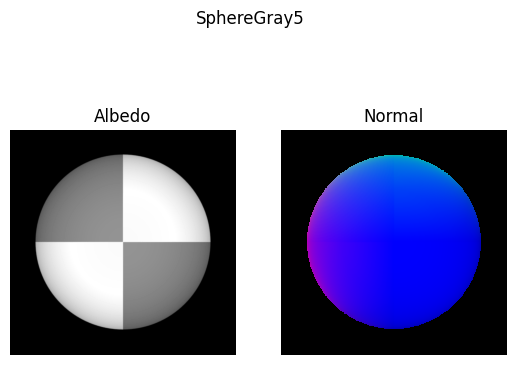

In [23]:
# load syn images
image_stack, scriptV = load_syn_images()

# estimate_alb_nrm
image_albedo, image_normal = estimate_alb_nrm(image_stack, scriptV)

# Show results
plt.suptitle('SphereGray5')
plt.subplot(121)
plt.imshow(image_albedo, cmap="gray")
plt.title('Albedo')
plt.axis('off')
plt.subplot(122)
plt.imshow(image_normal, cmap="gray")
plt.title('Normal')
plt.axis('off')

(512, 512)


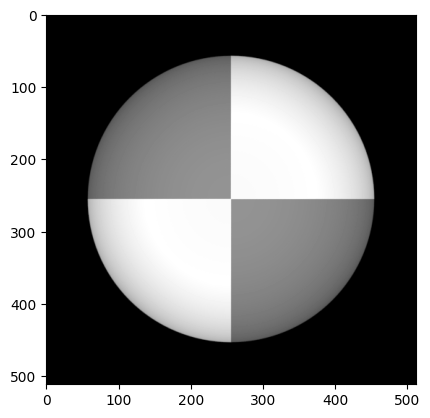

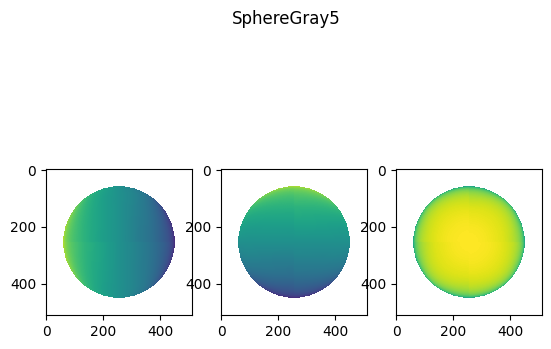

In [24]:
show_results(image_albedo, image_normal, height_map=None, SE=None, title="SphereGray5")

#### Skipping the shadow trick

/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

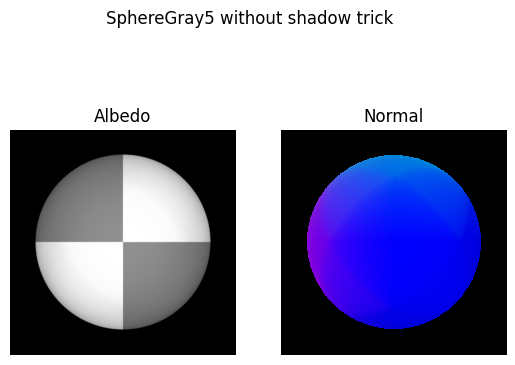

In [25]:
image_albedo_no_shadow, image_normal_no_shadow = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

# Show results
plt.suptitle('SphereGray5 without shadow trick')
plt.subplot(121)
plt.imshow(image_albedo_no_shadow, cmap="gray")
plt.title('Albedo')
plt.axis('off')
plt.subplot(122)
plt.imshow(image_normal_no_shadow, cmap="gray")
plt.title('Normal')
plt.axis('off')

(512, 512)


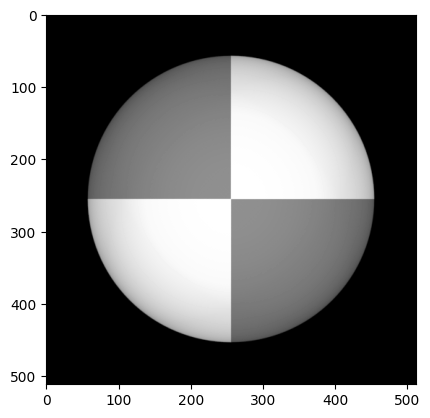

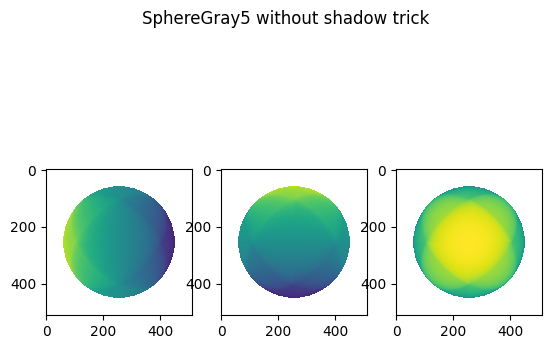

In [26]:
show_results(image_albedo_no_shadow, image_normal_no_shadow, height_map=None, SE=None, title="SphereGray5 without shadow trick")

#### Estimating using more images

Image size (H*W): 512*512


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

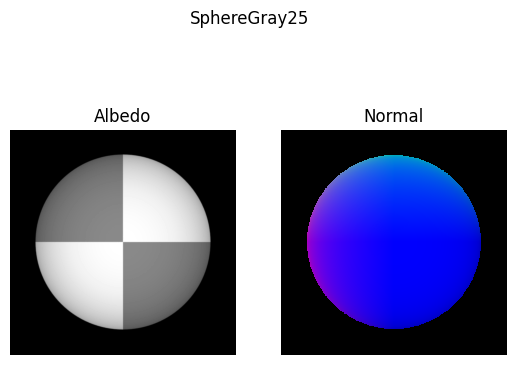

In [27]:
# load syn images
image_stack_25, scriptV_25 = load_syn_images(image_dir='./images/photometrics_images/SphereGray25/')

# estimate_alb_nrm
image_albedo_25, image_normal_25 = estimate_alb_nrm(image_stack_25, scriptV_25)

# Show results
plt.suptitle('SphereGray25')
plt.subplot(121)
plt.imshow(image_albedo_25, cmap="gray")
plt.title('Albedo')
plt.axis('off')
plt.subplot(122)
plt.imshow(image_normal_25, cmap="gray")
plt.title('Normal')
plt.axis('off')

(512, 512)


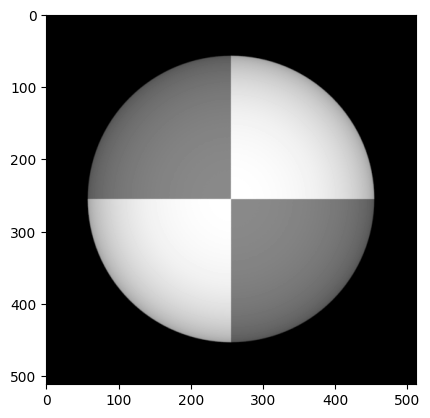

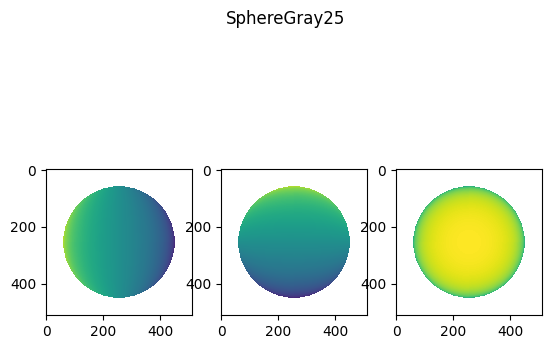

In [28]:
show_results(image_albedo_25, image_normal_25, height_map=None, SE=None, title="SphereGray25")

#### Without shadow trick

/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(-0.5, 511.5, 511.5, -0.5)

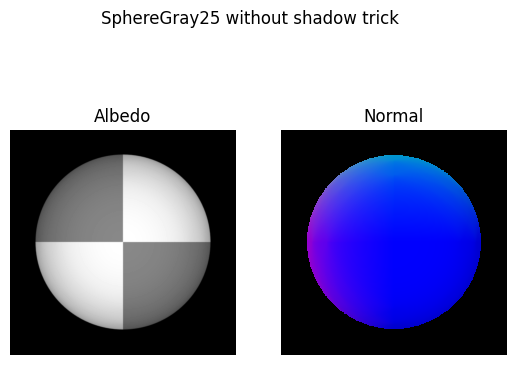

In [29]:
image_albedo_25_no_shadow, image_normal_25_no_shadow = estimate_alb_nrm(image_stack_25, scriptV_25, shadow_trick=False)

# Show results
plt.suptitle('SphereGray25 without shadow trick')
plt.subplot(121)
plt.imshow(image_albedo_25_no_shadow, cmap="gray")
plt.title('Albedo')
plt.axis('off')
plt.subplot(122)
plt.imshow(image_normal_25_no_shadow, cmap="gray")
plt.title('Normal')
plt.axis('off')

(512, 512)


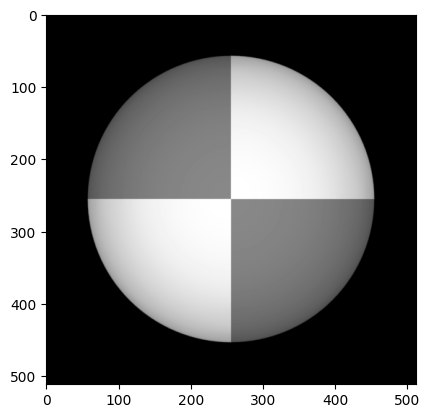

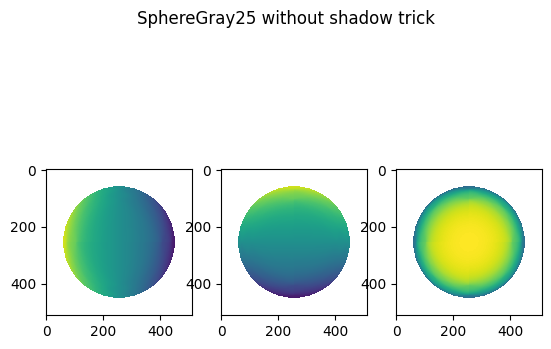

In [30]:
show_results(image_albedo_25_no_shadow, image_normal_25_no_shadow, height_map=None, SE=None, title="SphereGray25 without shadow trick")

##### **Answers to questions**

1. The albedo represents the inherent color of a surface without the influence of light. Given that the object is a grayscale checker texture sphere, I expect to see a checkerboard pattern in shades of gray.

2. In principle, we need at least 3 images to estimate the albedo and surface normal since we have three unknowns in the g vector (gx, gy, gz). With more images, the solution is over-determined which can provide a more accurate estimate through techniques like LS. By using SphereGray25, the results are more refined and possibly less sensitive to noise or outliers in the lighting data.

3. Shadows can lead to incorrect estimates of the normals. The trick used in the book is to weigh contributions based on the observed intensity, effectively reducing the influence of shadowed regions. When the trick is disabled, shadowed areas might produce incorrect normals. With only 5 images, as it can be seen under `show_results(image_albedo_no_shadow, image_normal_no_shadow, height_map=None, SE=None)`, the shading affects the result image given the two hues. Therefore, the trick is critical as there's less data to work with. But with 25 images this ambiguity is offset by the increased number of datapoints, thus the method is more robust to shadows even without the trick. Indeed, there is little to no difference between `show_results(image_albedo_25, image_normal_25, height_map=None, SE=None)` and `show_results(image_albedo_25_no_shadow, image_normal_25_no_shadow, height_map=None, SE=None)`.


### 4.2 Test of Integrability *(10 pts)*



Before we can reconstruct the surface height map, it is required to compute the partial derivatives $\frac{\delta f}{\delta x}$ and $\frac{\delta f}{\delta y}$ (or *p* and *q* in the algorithm). The partial derivatives also give us a chance to double check our computation, namely the test of *integrability*.

#### 4.2.1. Compute the partial derivatives (p and q in the algorithm) by filling in your code into **check_integrability()** (5 pts).

#### 4.2.2. Second derivatives (5 pts)

Implement and compute the second derivatives according to the algorithm and perform the test of integrability by choosing a reasonable threshold. What could be the reasons for the errors? How does the test perform with different numbers of images used in the reconstruction process in 4.1?

In [31]:
def check_integrability(normals):
    '''
    Check the surface gradient is acceptable
    INPUTS:
        - normals: normal image
    OUTPUTS:
        - p : df / dx
        - q : df / dy
        - SE : Squared Errors of the 2 second derivatives
    '''
    
    height, width, n_channels = normals.shape

    # initalization
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    dp_dy = np.zeros(normals.shape[:2])
    dq_dx = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # ================
    # YOUR CODE HERE
    # ================
    # Compute p and q, where
    # p measures value of df / dx
    # q measures value of df / dy
    
    N1 = normals[:, :, 0]
    N2 = normals[:, :, 1]
    N3 = normals[:, :, 2]
    
    # p measures value of df / dx
    p = N1 / N3
    
    # q measures value of df / dy
    q = N2 / N3

    # change nan to 0
    p[p != p] = 0
    q[q !=q ] = 0

    for i in range(height):
        for j in range(width):
            # if edge: approximate derivative based on the next element
            if j == 0:
                # f''(x) = f'(x + 1) - f'(x)
                dq_dx[i, j] = q[i, j + 1] - q[i, j]
            elif j == width - 1:
                # f''(x) = f'(x - 1) - f'(x)
                dq_dx[i, j] = q[i, j - 1] - q[i, j]
            else:
                # f''(x) = f'(x - 1) - f'(x)
                dq_dx[i, j] = ((q[i, j - 1] + q[i, j + 1]) / 2) - q[i, j]
            
            # if edge: approximate derivative based on the next element
            if i == 0:
                # f''(y) = f'(y + 1) - f'(y)
                dp_dy[i, j] = p[i + 1, j] - p[i, j]
            elif i == height - 1:
                # f''(y) = f'(y - 1) - f'(y)
                dp_dy[i, j] = p[i - 1, j] - p[i, j]
            else:
                # f''(y) = f'(y - 1) - f'(y)
                dp_dy[i, j] = ((p[i - 1, j] + p[i + 1, j]) / 2) - p[i, j]
    
    SE = (dp_dy - dq_dx) ** 2
    
    return p, q, SE


In [32]:
p, q, SE = check_integrability(image_normal)
p_no_shadow, q_no_shadow, SE_no_shadow = check_integrability(image_normal_no_shadow)
p_25, q_25, SE_25 = check_integrability(image_normal_25)
p_25_no_shadow, q_25_no_shadow, SE_25_no_shadow = check_integrability(image_normal_25_no_shadow)

In [33]:
print('------------ 5 images ----------------')
print('SE for 5 images:', SE.shape, SE.max())
print('SE for 5 images (no shadow):', SE_no_shadow.shape, SE_no_shadow.max())
print('------------ 25 images ----------------')
print('SE for 25 images:', SE_25.shape, SE_25.max())
print('SE for 25 images (no shadow):', SE_25_no_shadow.shape, SE_25_no_shadow.max())

------------ 5 images ----------------
SE for 5 images: (512, 512) 7.493906250000009
SE for 5 images (no shadow): (512, 512) 0.981452390854821
------------ 25 images ----------------
SE for 25 images: (512, 512) 1.7690377448777195
SE for 25 images (no shadow): (512, 512) 1.0718663619221525


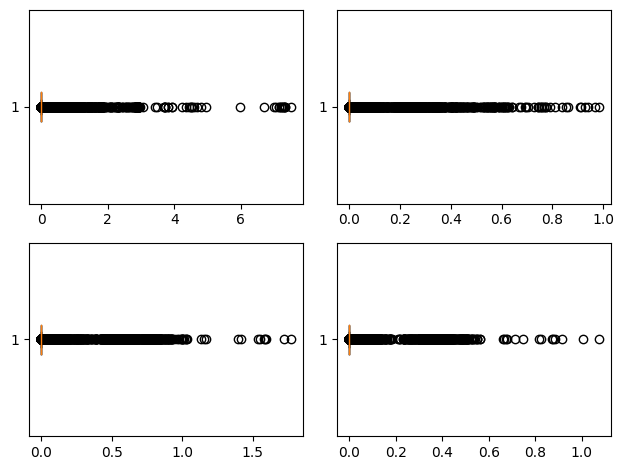

In [34]:
plt.subplot(2, 2, 1)
plt.boxplot(SE.flatten(), vert=False)

plt.subplot(2, 2, 2)
plt.boxplot(SE_no_shadow.flatten(), vert=False)

plt.subplot(2, 2, 3)
plt.boxplot(SE_25.flatten(), vert=False)

plt.subplot(2, 2, 4)
plt.boxplot(SE_25_no_shadow.flatten(), vert=False)

plt.tight_layout()
plt.show()

A threshold can be set using the 68–95–99.7 rule (aka. 3 Sigma rule)

In [35]:
threshold_5 = SE.mean() + (SE.std() * 3)
threshold_25 = SE_25.mean() + (SE_25.std() * 3)

print('Threshold calculated based on 5 images:', threshold_5)
print('Threshold calculated based on 25 images:', threshold_25)

threshold_5_no_shad = SE_no_shadow.mean() + (SE_no_shadow.std() * 3)
threshold_25_no_shad = SE_25_no_shadow.mean() + (SE_25_no_shadow.std() * 3)

print('Threshold calculated based on 5 images (no shadow):', threshold_5_no_shad)
print('Threshold calculated based on 25 images (no shadow):', threshold_25_no_shad)

Threshold calculated based on 5 images: 0.27978884633224727
Threshold calculated based on 25 images: 0.09459864299274108
Threshold calculated based on 5 images (no shadow): 0.0502627707797625
Threshold calculated based on 25 images (no shadow): 0.05258843647087691


*What could be the reasons for the errors?*

- **Noise in Images**: Even a small amount of noise in the images can lead to errors in the calculated normals and thus in the second derivatives.
- **Sampling Resolution**: Using a finite approximation for the derivatives might introduce errors, especially if the surface has high-frequency changes.
- **Shadows**: Shadows can distort the perceived intensity of a surface, leading to errors in the calculated normals. Indeed, the SE for no_shadow is much smaller.

*How does the test perform with different numbers of images used in the reconstruction process in 4.1?*

- Using more images generally results in more accurate and stable normals, as there is more information to resolve ambiguities.

### 4.3 Shape by Integration *(15 pts)*  
To reconstruct the surface height map, we need to continuously integrate the partial derivatives over a path. However, as we are working with discrete structures, you will be simply summing their values.

The algorithm in the chapter presents a way to do the integration in column-major order, that is you start at the top-left corner and integrate along the first column, then go towards the right along each row. Yet, it is also noticed that it would be better to use many different paths and average so as to spread around the errors in the derivative estimates.

#### 4.3.1. Construct the surface height map (7 pts)

Construct the surface height map using column-major order as described in the algorithm, then implement row-major path integration. Your code should go in **construct_surface()**.

**Note**: By default, Numpy used row-major operations. So if you are unrolling an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to be column-major. Otherwise, if you are using the double for-loops without an unrolling operation, then this concern doesn’t apply.

**Hint**: You could further inspect the shape of the objects and normal directions by using **matplotlib.pyplot.quiver** function. You will have to choose appropriate sub-sampling ratios for proper illustration. You code goes to the **show_results()** function in the code cell above.

In [36]:
def construct_surface(p, q, path_type='column'):
    '''
    Construct the surface function represented as height_map
    INPUT:
       - p : measures value of df / dx
       - q : measures value of df / dy
       - path_type: type of path to construct height_map, either 'column',
         'row', or 'average'
    OUTPUT:
       - height_map: the reconstructed surface
    '''
    # ================
    # YOUR CODE HERE
    # ================
    # top left corner of height_map is zero
    # for each pixel in the left column of height_map
    #  height_value = previous_height_value + corresponding_q_value

    # for each row
    #   for each element of the row except for leftmost
    #       height_value = previous_height_value + corresponding_p_value

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type=='column':
        height_map = integrate_column_wise(h, w, p, q)

    elif path_type=='row':
         height_map = integrate_row_wise(h, w, p, q)

    elif path_type=='average':
        height_map_col = integrate_column_wise(h, w, p, q)
        height_map_row = integrate_row_wise(h, w, p, q)
        # height_map_col_reverse = integrate_column_wise_reverse(h, w, p, q)
        # height_map_row_reverse = integrate_row_wise_reverse(h, w, p, q)
        
        height_map_stack = np.stack([height_map_col, height_map_row], axis=2)
        height_map = np.mean(height_map_stack, axis=2)

    elif path_type=='median':
        height_map_col = integrate_column_wise(h, w, p, q)
        height_map_row = integrate_row_wise(h, w, p, q)
        # height_map_col_reverse = integrate_column_wise_reverse(h, w, p, q)
        # height_map_row_reverse = integrate_row_wise_reverse(h, w, p, q)
        
        height_map_stack = np.stack([height_map_col, height_map_row], axis=2)
        height_map = np.median(height_map_stack, axis=2)

    return height_map


def integrate_column_wise(height, width, p , q):
    height_map = np.zeros([height, width])
    
    for row_number in range(1, height):
        height_map[row_number, 0] = height_map[row_number - 1, 0] + q[row_number, 0]

    for row_number in range(height):
        for col_number in range(1, width):
            height_map[row_number, col_number] = height_map[row_number, col_number - 1] + p[row_number, col_number]
    return height_map


def integrate_row_wise(height, width, p, q):
    height_map = np.zeros([height, width])
    
    for col_number in range(1, width):
        height_map[0, col_number] = height_map[0, col_number - 1] + p[0, col_number]

    for col_number in range(width):
        for row_number in range(1, height):
            height_map[row_number, col_number] = height_map[row_number - 1, col_number] + q[row_number, col_number]
    return height_map


def integrate_column_wise_reverse(height, width, p , q):
    height_map = np.zeros([height, width])
    
    for row_number in reversed(range(height - 1)):
        height_map[row_number, width - 1] = height_map[row_number + 1, width - 1] + q[row_number, width - 1]

    for row_number in reversed(range(height)):
        for col_number in reversed(range(width - 1)):
            height_map[row_number, col_number] = height_map[row_number, col_number + 1] + p[row_number, col_number]
    return height_map


def integrate_row_wise_reverse(height, width, p, q):
    height_map = np.zeros([height, width])
    
    for col_number in reversed(range(width - 1)):
        height_map[height - 1, col_number] = height_map[height - 1, col_number + 1] + p[height - 1, col_number]

    for col_number in reversed(range(width)):
        for row_number in reversed(range(height - 1)):
            height_map[row_number, col_number] = height_map[row_number + 1, col_number] + q[row_number, col_number]
    return height_map

p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


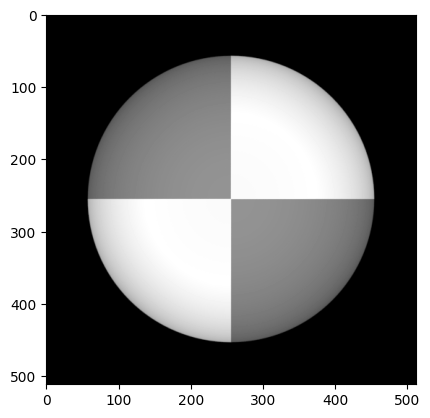

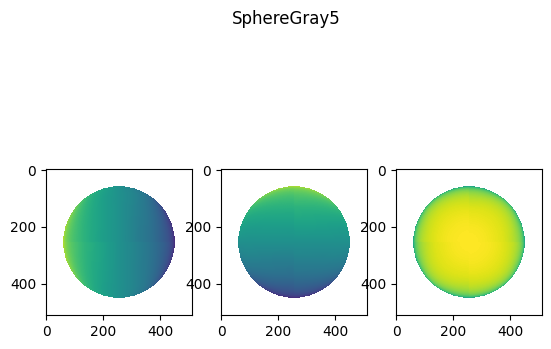

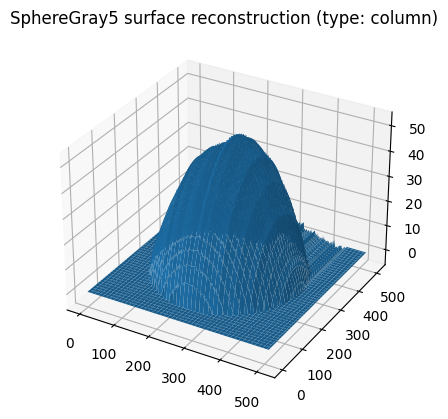

In [37]:
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='column')

show_results(image_albedo, image_normal, height_map, title="SphereGray5", height_map_title="SphereGray5 surface reconstruction (type: column)")

p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


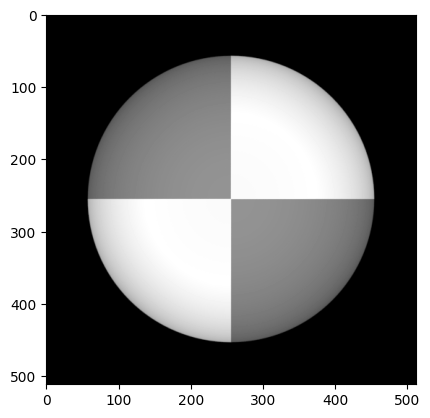

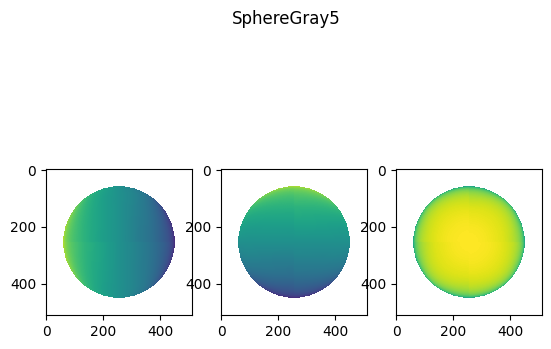

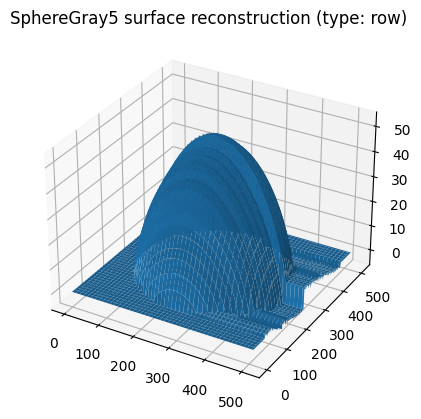

In [38]:
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='row')

show_results(image_albedo, image_normal, height_map, title="SphereGray5", height_map_title="SphereGray5 surface reconstruction (type: row)")

#### 4.3.2. What are the differences in the results of the two paths? (4 pts)


When integrating using the column-major path, the integration errors accumulate primarily in the horizontal direction. On the flip side, with row-major integration, errors accumulate mainly in the vertical direction.
Because of these discrepancies, the reconstructed height maps for row-major and column-major paths may differ, particularly at locations distant from the starting points.


#### 4.3.3. Now, take the average of the results. (4 pts)

Do you see any improvement compared to when using only one path? Are the construction results different with different numbers of images being used?

p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


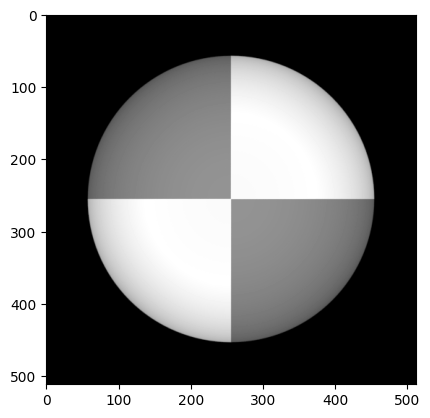

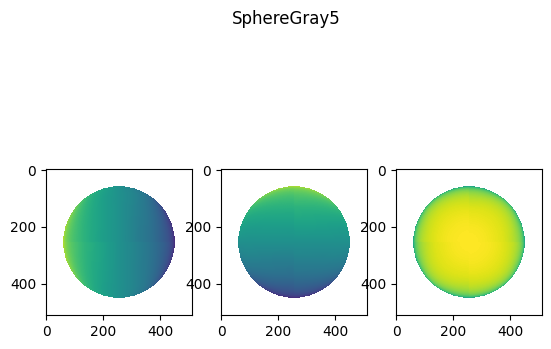

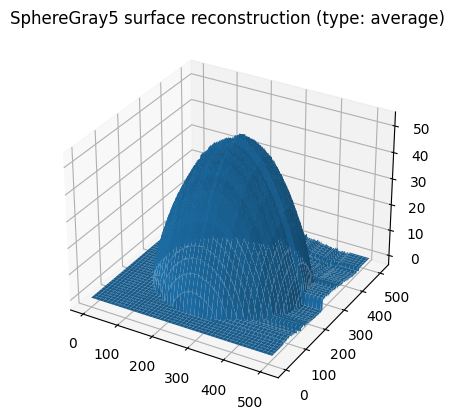

In [39]:
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='average')

show_results(image_albedo, image_normal, height_map, title="SphereGray5", height_map_title="SphereGray5 surface reconstruction (type: average)")

By averaging the height maps obtained from both the row-major and column-major paths, we can offset some of the integration errors and generally obtain a smoother, more accurate reconstruction. This is because errors that appear due to one path type could potentially be compensated for by the other path type.

### 4.4 Experiments with different objects *(20 pts)*
In this part, you will try to run the photometric stereo algorithm in a various number of scenarios to see how well it can be generalized.

#### 4.4.1. Run the algorithm and show the results for the MonkeyGray model. *(5 pts)*

##### 1.a Complete the code below, run the algorithm and show the results

In [40]:
def photometric_stereo(image_dir='./images/photometrics_images/MonkeyGray/', path_type='column'):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_syn_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    image_albedo, image_normal = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    # YOUR CODE HERE
    p, q, SE = check_integrability(image_normal)
    

    threshold = SE.mean() + (SE.std() * 3)
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    # YOUR CODE HERE
    show_results(image_albedo, image_normal, height_map, title="MonkeyGray", height_map_title=f"MonkeyGray surface reconstruction (type: {path_type})")

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking

Number of outliers: 1058

(512, 512)


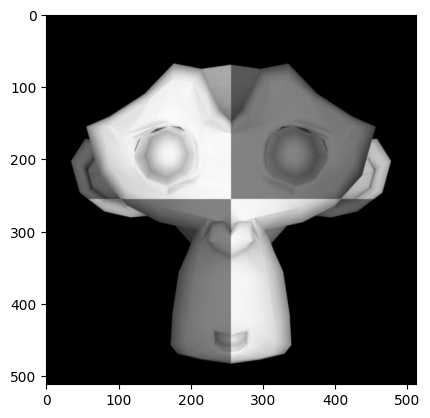

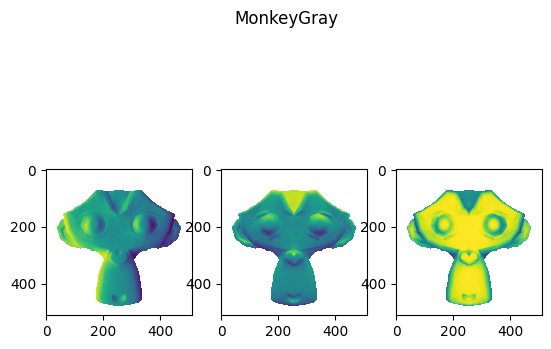

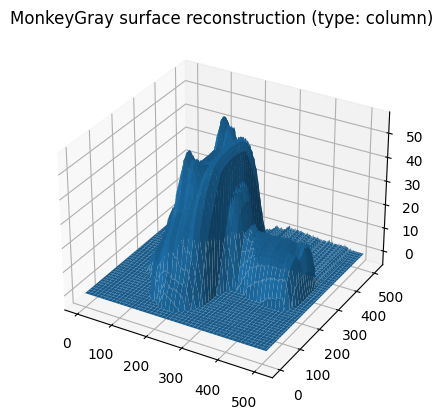

In [41]:
# Use the function
image_dir = 'images/photometrics_images/MonkeyGray/'

photometric_stereo(image_dir, path_type='column')
# photometric_stereo(image_dir, path_type='row')
# photometric_stereo(image_dir, path_type='average')

##### 1.b Explain errors

The albedo results of the monkey may comprise more albedo errors than in case of the sphere. Observe and describe the errors: Experiment with different cases and observe the errors that arise. (You don't need to calculate and give numerical errors.)

What could be the reason for those errors? You may want to experiment with different numbers of images as you did in Question 1 to see the effects.

The results for complex objects like a monkey shaped object might exhibit more errors due to:

- **Noise** in image
- **Shadows**: Parts of the object might cast shadows on other parts, affecting the intensity values.
- **Specularity**: Bright spots might occur due to reflection, which can deviate from the Lambertian assumption.
- **Texture and intricate geometry**: Complex geometries can lead to rapid changes in normal directions.


##### 1.c What do you think could help solving these errors?

- Using more images can give a more robust estimation of the surface normals, given the complexity of the surface.
- Addressing specularity by identifying and handling reflections.

#### 4.4.2. Three-channel images. *(5 pts)*

So far, we have assumed that albedos are 1-channel grayscale images and that input images are also 1-channel. To work with 3-channel images, a simple solution is to split the input image into separate channels and treat them individually. Yet, that would generate a small problem while constructing the surface normal map if a pixel value in a channel is zero.


##### 2.a Update the implementation to work for 3-channel RGB inputs and test it with 2 models SphereColor and MonkeyColor.


In [42]:
def photometric_stereo_rgb(image_dir='./images/photometrics_images/SphereColor/', title=None, height_map_title=None):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    image_stack_R, scriptV = load_syn_images(image_dir=image_dir, channel=0)
    image_stack_G, _ = load_syn_images(image_dir=image_dir, channel=1)
    image_stack_B, _ = load_syn_images(image_dir=image_dir, channel=2)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    image_albedo_R, image_normal_R = estimate_alb_nrm(image_stack_R, scriptV, shadow_trick=False)
    image_albedo_G, image_normal_G = estimate_alb_nrm(image_stack_G, scriptV, shadow_trick=False)
    image_albedo_B, image_normal_B = estimate_alb_nrm(image_stack_B, scriptV, shadow_trick=False)

    image_albedo_RGB = np.stack([image_albedo_R, image_albedo_G, image_albedo_B], axis=2)
    
    # change nan to 0
    image_normal_R[image_normal_R != image_normal_R] = 0
    image_normal_G[image_normal_G != image_normal_G] = 0
    image_normal_B[image_normal_B != image_normal_B] = 0

    # image_normal_RGB = np.sum([image_normal_R, image_normal_G, image_normal_B], axis=-1) / 3
    image_normal_RGB = (image_normal_R + image_normal_G + image_normal_B) / 3

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    # YOUR CODE HERE
    p, q, SE = check_integrability(image_normal_RGB)

    threshold = SE.mean() + (SE.std() * 3)
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type='column')

    # show results
    # YOUR CODE HERE
    show_results(image_albedo_RGB, image_normal_RGB, height_map, title=title, height_map_title=height_map_title)


##### 2.b Explain your changes and show your results.

The function `photometric_stereo_rgb` is responsible for estimating the albedo and surface normals for a 3-channel RGB image. This is done, by calculating the albedo and surface normals for each channel separately using `estimate_alb_nrm`.

Short code explanation:
- The `scriptV` value is the same for each of the channels, thus it is loaded only once.

- The following code averages the image normals calculated for each separate channel `(image_normal_R + image_normal_G + image_normal_B) / 3`.

- Stacking albedo calculated for each channel and forming a single array `np.stack([image_albedo_R, image_albedo_G, image_albedo_B], axis=2)`

Loading images...

Image size (H*W): 512*512
Image size (H*W): 512*512
Image size (H*W): 512*512
Finish loading 5 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/624986489.py:33: RuntimeWarning: invalid value encountered in true_divide
  p = N1 / N3
/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/624986489.py:36: RuntimeWarning: invalid value encountered in true_divide
  q = N2 / N3
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Number of outliers: 781

(512, 512, 3)


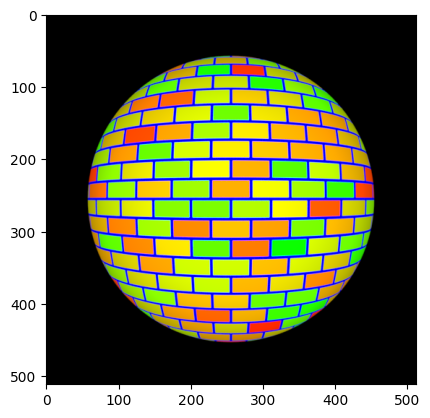

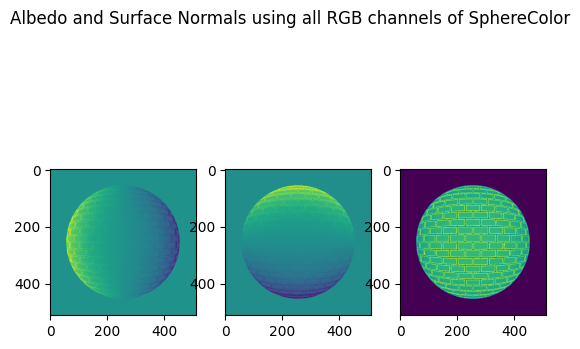

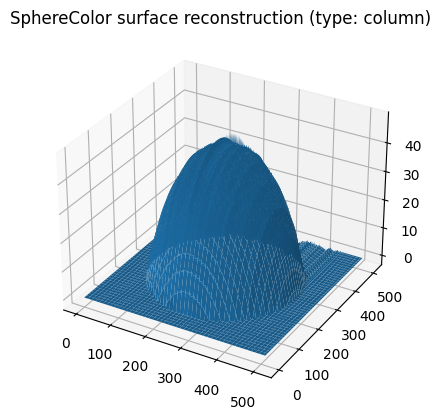

In [43]:
photometric_stereo_rgb(image_dir='./images/photometrics_images/SphereColor/', title='Albedo and Surface Normals using all RGB channels of SphereColor', height_map_title="SphereColor surface reconstruction (type: column)")

#### MonkeyColor

Loading images...

Image size (H*W): 512*512
Image size (H*W): 512*512
Image size (H*W): 512*512
Finish loading 5 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/624986489.py:33: RuntimeWarning: invalid value encountered in true_divide
  p = N1 / N3
/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/624986489.py:36: RuntimeWarning: invalid value encountered in true_divide
  q = N2 / N3
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Number of outliers: 1065

(512, 512, 3)


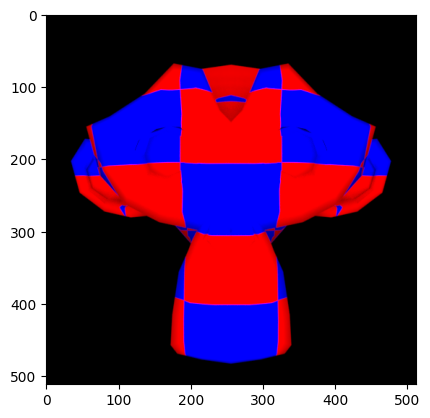

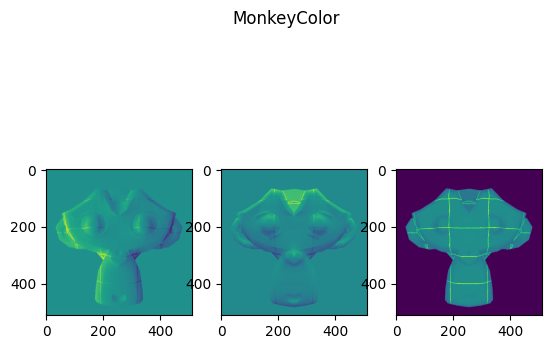

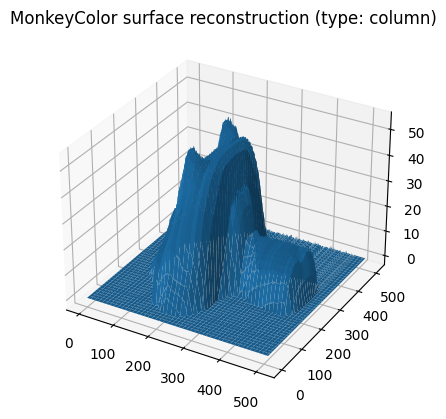

In [44]:
photometric_stereo_rgb(image_dir='images/photometrics_images/MonkeyColor/', title="MonkeyColor", height_map_title="MonkeyColor surface reconstruction (type: column)")

##### 2.c Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

When we construct the surface normal map we calculate the gradients of the channels, but when a pixel has a zero value we would try to divide by zero, which is impossible resulting in some faults in the surface normal map.
A way to overcome this problem is by adding a very small value to every pixel with a value 0. This technique is called epsilon clipping.


#### 4.4.3. Real world dataset A *(5 pts)*   

Now, it's the time to try the algorithm on real-world datasets. For that purpose, we are going the use the Yale Face Database and the Apple dataset.

First the Yale Face Database.

##### 3.a Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material.

##### 3.b Observe and discuss the results for different integration paths.

An answer box can be found below the code cells.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [45]:
## help functions for loading Yale Face and Apple images

def load_face_images(image_dir='./images/photometrics_images/yaleB02/'):
    num_images = 64
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    h, w = ambient_image.shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image


    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    scriptV = np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV


def load_apple_images(image_dir='./images/photometrics_images/Apple'):
    num_images = 99
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    h, w = try_image[:,:,0].shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = []
    for i in filenames:
        filenames_idx.append(int(i.split('_')[1].split('.')[0]))

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:, :, 2]

    with open('./images/photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    scriptV = [-1,1,1] * np.array([x,y,z]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV

In [46]:
'''
For each of Face and Apple, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface albedo and normal mape surface height
- Show the results
'''

## Face
def photometric_stereo_face(image_dir='./images/photometrics_images/yaleB02/', path_type='average'):
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    image_albedo, image_normal = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)
    

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(image_normal)


    # YOUR CODE HERE
    threshold = SE.mean() + (SE.std() * 3)
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    # YOUR CODE HERE
    show_results(image_albedo, image_normal, height_map)

## Apple
def photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='average'):
    
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    image_albedo, image_normal = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(image_normal)

    # YOUR CODE HERE
    threshold = SE.mean() + (SE.std() * 3)
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    # YOUR CODE HERE
    show_results(image_albedo, image_normal, height_map)

Finish loading 64 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 6

(192, 168)


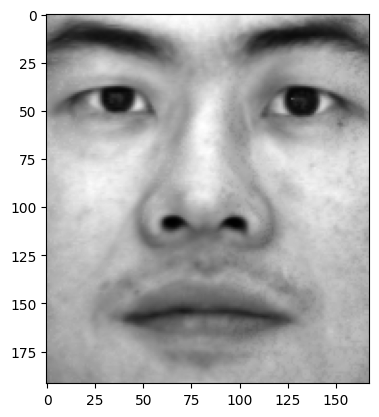

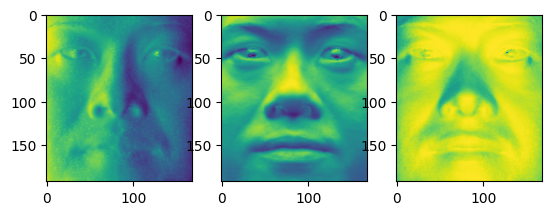

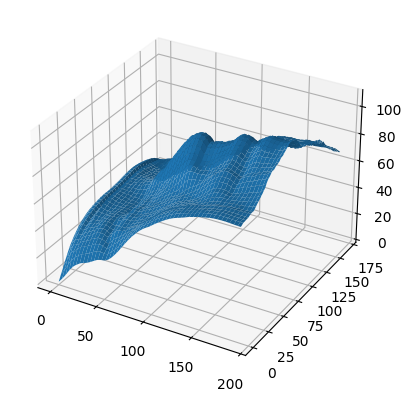

In [47]:
photometric_stereo_face(path_type="average")

Finish loading 64 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 6

(192, 168)


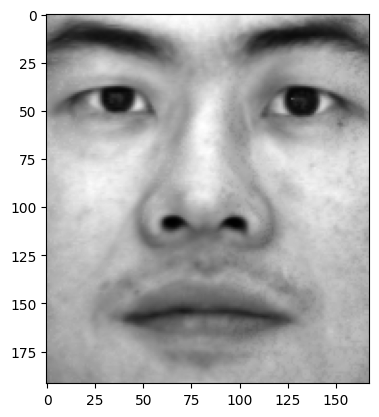

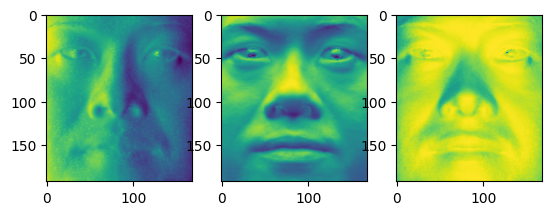

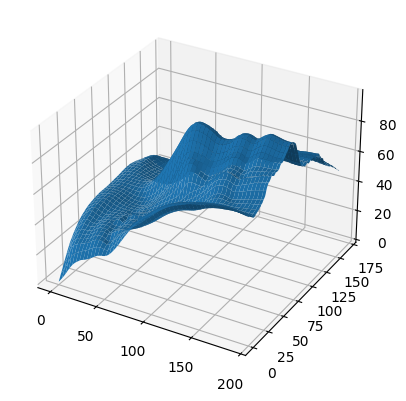

In [48]:
photometric_stereo_face(path_type="row")

Finish loading 64 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 6

(192, 168)


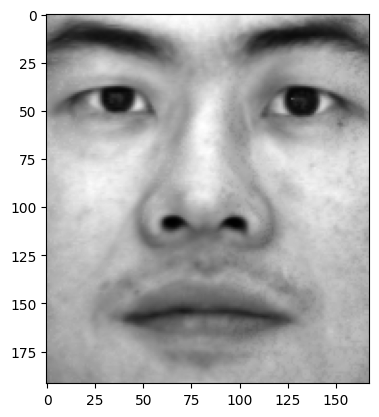

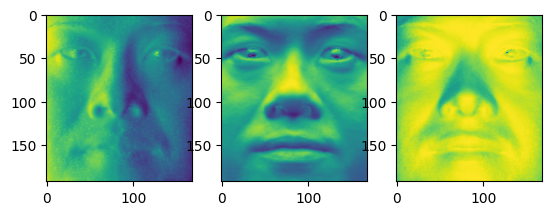

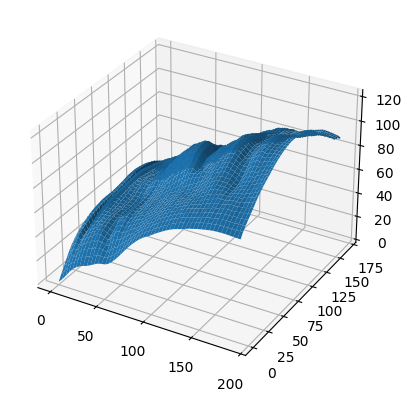

In [49]:
photometric_stereo_face(path_type="column")

**Observations and Discussions**

- **Albedo Map**: For the Yale Face dataset, the albedo map gives a good representation of the facial features. Areas with brighter intensities indicate more reflectance (like the nose and cheek bones), while darker regions indicate less reflectance (like eyes and mouth).

- **Height Map**: Depending on the integration path chosen (row, column, or average), as it can be seen above, the reconstructed 3D face looks different: for example, the row wise path is "flatter", whereas the column wise path accentuates features as it can be seen with a much more evident nose. The average path usually gives the most robust result, as it takes into account both row-wise and column-wise paths.

##### 3.c Discuss how the images violate the assumptions of the shape-from-shading methods. Remember to include specific input images to illustrate your points.


- Photometric stereo assumes that the surface is Lambertian. However, human skin, is not a perfect Lambertian surface: the skin has complex reflection properties (e.g., oils on the skin can be a factor, for example).

- The method assumes that light source directions are known and fixed. In real-world scenarios, especially with datasets acquired without strict laboratory conditions, the lighting directions might not be precisely known, leading to inaccuracies in the derived normals.

- Photometric stereo assumes that only one light source is active at a time. If there's any additional lighting affecting the scene, it can lead to inaccuracies.

- Shadows and inter-reflections can lead to problems like we saw with the monkey shaped object: deep eye sockets or the underside of the nose can cast shadows. Shadows introduce areas in the image that don't adhere to the photometric stereo model because they are not directly lit. Similarly, inter-reflections, such as light reflecting off the cheek and illuminating the underside of the nose can cause issues of re-illumination of areas that are not directly exposed to the lighting source.

- The method assumes a constant albedo across the surface. This is clearly not the case for faces, which have varying pigmentation and features like freckles, facial hair, and blemishes.


Images are in .pgm format, but a representative image for these issues is below, where one can see the shadow given by the nose, the slight moustache that makes the albedo non uniform etc.

![Alt text](yaleB02_P00A-035E-20.png)

##### 3.d How would the results improve when the problematic images are all removed? Try it out and show the results in your notebook.

*Write your answer here*

#### 4.4.4. Real world dataset B (5 pts).  

And finally, the Apple dataset. Show your results on real-world 3-channel RGB inputs, contained in the "Apple" folder.

Observe and discuss the results for different integration paths. You may find difficulties in using this non-sythetic dataset. Try if filtering may help.

Finish loading 99 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 3899

(696, 646)


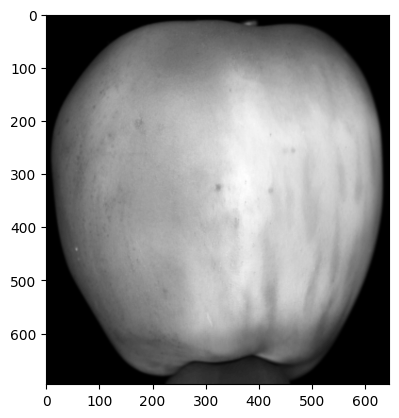

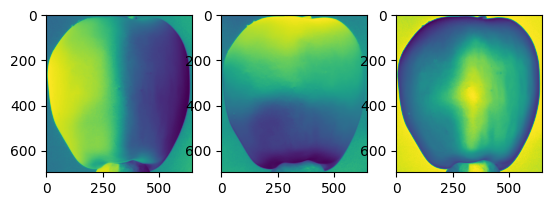

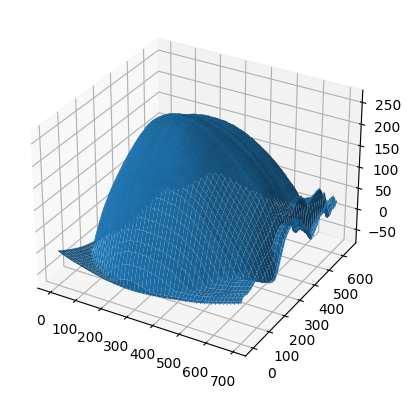

In [50]:
photometric_stereo_apple(path_type="average")

Finish loading 99 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 3899

(696, 646)


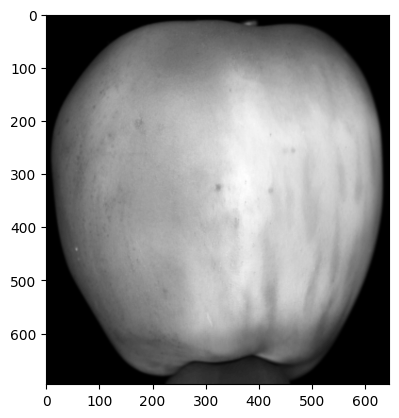

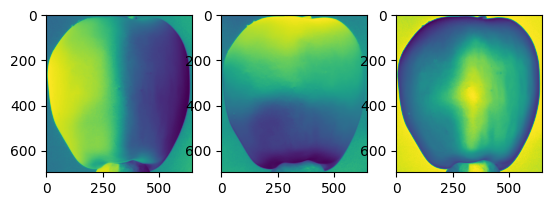

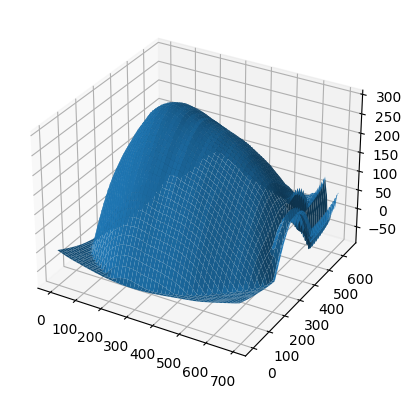

In [51]:
photometric_stereo_apple(path_type="column")

Finish loading 99 images.

Computing surface albedo and normal map...



/var/folders/_1/grmv219n3mzbyfj882m03j3c0000gn/T/ipykernel_65020/2460000945.py:29: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.
  g, _, _, _ = np.linalg.lstsq(scriptI @ scriptV, scriptI @ vector_i)


Integrability checking
Number of outliers: 3899

(696, 646)


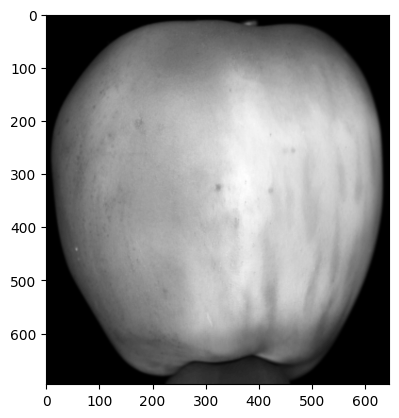

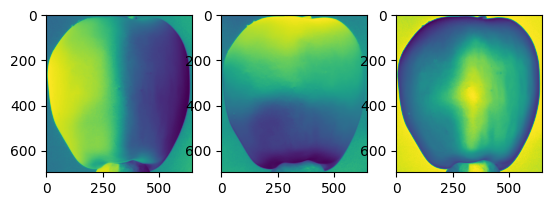

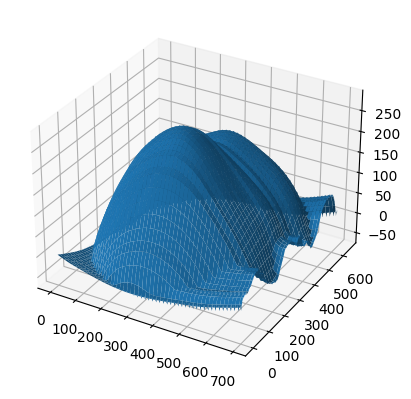

In [52]:
photometric_stereo_apple(path_type="row")

Due to the limitations of the provided function - `photometric_stereo_apple`, the tests have been performed for images with a single color channel. Despite that, differences in the methods of height map constructions are still noticeable. Similarly to the previous experiments, the surface looks slightly skewed, depending on the chosen integration path (average, column, row).

# X Individual Contribution Report *(Mandatory)*

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.


Name: Fien De Kok

Contribution on research: 30% \
Contribution on programming: 30% \
Contribution on writing: 40%

Name: Jakub Tomaszewski

Contribution on research: 30% \
Contribution on programming: 40% \
Contribution on writing: 30%

Name: Joan Valja

Contribution on research: 40% \
Contribution on programming: 30% \
Contribution on writing: 30%

# -End of Notebook-